# Plotting collapse experiment results

In [8]:
import json
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from oceantracker.post_processing.read_output_files.load_output_files import load_track_data
from oceantracker.post_processing.read_output_files.load_output_files import get_case_info_files_from_dir
from oceantracker.post_processing.read_output_files.load_output_files import read_case_info_file

from oceantracker.post_processing.transect_projection.transect import Transect

from oceantracker.post_processing.plotting.plot_collapse import hexmap_of_particle_prop
from oceantracker.post_processing.plotting.plot_collapse import hexmap_of_fraction_above_threshold
from oceantracker.post_processing.plotting.plot_collapse import hexmap_of_death


from oceantracker.post_processing.plotting.plot_collapse import plot_depth_along_transect
from oceantracker.post_processing.plotting.plot_collapse import plot_part_prop_along_transect
from oceantracker.post_processing.plotting.plot_collapse import plot_relative_depth_along_transect


## building transect

In [2]:
# def json_to_python(json_str):
#     """
#     Convert JSON string back to Python object with numpy arrays.
#     Note: This assumes 'polygon_vertices' and 'plane_vertices' should be numpy arrays.
#     """
#     data = json.loads(json_str)
#     for item in data:
#         if 'polygon_vertices' in item:
#             item['polygon_vertices'] = np.array(item['polygon_vertices'])
#         if 'plane_vertices' in item:
#             item['plane_vertices'] = np.array(item['plane_vertices'])
#     return data

# with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/norder_elbe_transect.json', 'r') as f:
#     norder_elbe_transect = json_to_python(f.read())

# with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/sueder_elbe_transect.json', 'r') as f:
#     sueder_elbe_transect = json_to_python(f.read())

# norder_elbe = Transect(norder_elbe_transect)
# sueder_elbe = Transect(sueder_elbe_transect)

# with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/norder_elbe_transect.pkl', 'wb') as f:
#     pickle.dump(norder_elbe, f)

# with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/sueder_elbe_transect.pkl', 'wb') as f:
#     pickle.dump(sueder_elbe, f)  

In [3]:
with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/norder_elbe_transect.pkl', 'rb') as f:
    norder_elbe = pickle.load(f)

with open('/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/experiments/collapse/transects/sueder_elbe_transect.pkl', 'rb') as f:
    sueder_elbe = pickle.load(f)

## v38

In [7]:
data = {
    'r': [1e-05, 1e-05, 1e-05],
    's': [0.00, 0.01, 0.05],
    'dryout': [350, 2807, 2901],
    'salinity': [22854, 2831, 1080],
    'illumination': [6717, 15035, 16375],
    'alive': [22640, 31888, 32205],
    'dead': [29921, 20673, 20356]
}

df = pd.DataFrame(data)

print(df)

         r     s  dryout  salinity  illumination  alive   dead
0  0.00001  0.00     350     22854          6717  22640  29921
1  0.00001  0.01    2807      2831         15035  31888  20673
2  0.00001  0.05    2901      1080         16375  32205  20356


In [12]:
# fill df['s'] with values from 0 to 0.001
# and interpolate the other columns 
df_interpolated = pd.DataFrame()
df_interpolated['s'] = np.linspace(0, 0.001, 1000)
df_interpolated['dryout'] = np.interp(df_interpolated['s'], df['s'], df['dryout'])
df_interpolated['salinity'] = np.interp(df_interpolated['s'], df['s'], df['salinity'])
df_interpolated['illumination'] = np.interp(df_interpolated['s'], df['s'], df['illumination'])
df_interpolated['alive'] = np.interp(df_interpolated['s'], df['s'], df['alive'])
df_interpolated['dead'] = np.interp(df_interpolated['s'], df['s'], df['dead'])

df_interpolated


,s,dryout,salinity,illumination,alive,dead
0,0.000000,350.000000,22854.000000,6717.000000,22640.000000,29921.000000
1,0.000001,350.245946,22851.995696,6717.832633,22640.925726,29920.074274
2,0.000002,350.491892,22849.991391,6718.665265,22641.851451,29919.148549
3,0.000003,350.737838,22847.987087,6719.497898,22642.777177,29918.222823
4,0.000004,350.983784,22845.982783,6720.330531,22643.702903,29917.297097
...,...,...,...,...,...,...
995,0.000996,594.716216,20859.717217,7545.469469,23561.097097,28999.902903
996,0.000997,594.962162,20857.712913,7546.302102,23562.022823,28998.977177
997,0.000998,595.208108,20855.708609,7547.134735,23562.948549,28998.051451
998,0.000999,595.454054,20853.704304,7547.967367,23563.874274,28997.125726


In [33]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v37'

# create empty pd data frame with headears "radius, stickyness, illumination_threshold, probability_of_culling, cause_of_death
column_names = ['radius', 'stickyness', 'illumination_threshold', 'probability_of_culling', 'cause_of_death']
cause_of_death_df = pd.DataFrame(columns=column_names)

for ii in range(3):
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    case_info = read_case_info_file(case)
    r = case_info['full_case_params']['class_dicts']['particle_properties']['radius_spherical']['initial_value']
    a = case_info['full_case_params']['class_dicts']['particle_properties']['collision_very_fine_silt']['stickyness']
    i = case_info['full_case_params']['class_dicts']['trajectory_modifiers']['light_starvation_induced_mortality']['required_illumination']
    p = case_info['full_case_params']['class_dicts']['trajectory_modifiers']['light_starvation_induced_mortality']['probability_of_culling']


    cause_of_death = track_data['cause_of_death']
    cause_of_death = cause_of_death[-1,:]

    # create subset df
    cause_of_death_subset_df = pd.DataFrame({'cause_of_death': cause_of_death})

# Repeat values of r, a, i, and p to match the length of cause_of_death
    params_subset_df = pd.DataFrame({
        column_names[0]: [r] * len(cause_of_death),
        column_names[1]: [a] * len(cause_of_death),
        column_names[2]: [i] * len(cause_of_death),
        column_names[3]: [p] * len(cause_of_death)
    })

    # Concatenate df_params and df_cause_of_death along columns
    subset_df = pd.concat([params_subset_df, cause_of_death_subset_df], axis=1)

    # concat subset_df to cause_of_death_df
    cause_of_death_df = pd.concat([cause_of_death_df, subset_df], axis=0)

cause_of_death_df




/tmp/ipykernel_18783/955995988.py:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  cause_of_death_df = pd.concat([cause_of_death_df, subset_df], axis=0)


,radius,stickyness,illumination_threshold,probability_of_culling,cause_of_death
0,0.00001,0.00,30.0,0.000036,1.0
1,0.00001,0.00,30.0,0.000036,1.0
2,0.00001,0.00,30.0,0.000036,2.0
3,0.00001,0.00,30.0,0.000036,1.0
4,0.00001,0.00,30.0,0.000036,3.0
...,...,...,...,...,...
52556,0.00001,0.05,30.0,0.000036,0.0
52557,0.00001,0.05,30.0,0.000036,0.0
52558,0.00001,0.05,30.0,0.000036,0.0
52559,0.00001,0.05,30.0,0.000036,0.0


In [39]:
cause_of_death_without_survivers = cause_of_death_df.copy()
# drop all rows where cause of death is 0
cause_of_death_without_survivers = cause_of_death_without_survivers[cause_of_death_without_survivers['cause_of_death'] != 0]


/home/zmaw/u301513/.conda/envs/oceantracker/lib/python3.10/site-packages/seaborn/axisgrid.py:186: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  figlegend = self._figure.legend(handles, labels, **kwargs)


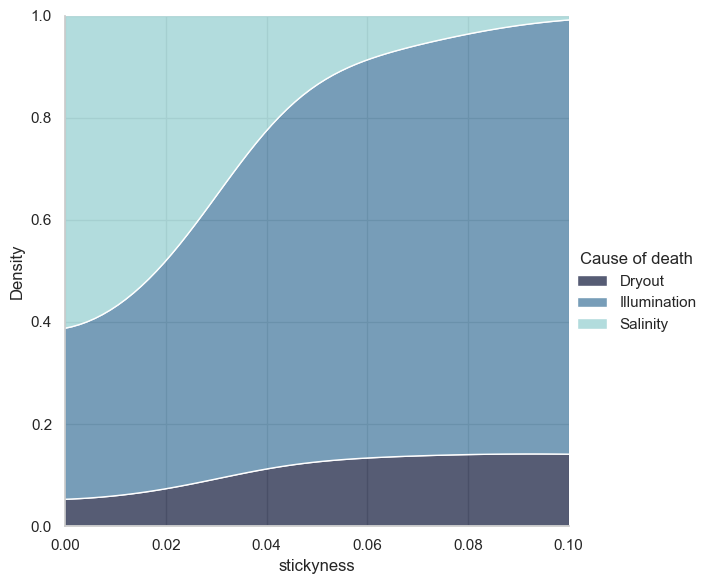

In [60]:
# fig,ax = plt.subplots(1,1)

ax = sns.displot(
    data=cause_of_death_without_survivers,
    x="stickyness", hue="cause_of_death",
    kind="kde", height=6,
    multiple="fill", #clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75",
    bw_method=2,
    legend=False
)

#set xlim to 0 to 0.1
ax.set(xlim=(0, 0.1))

# legend labels
ax.add_legend(title='Cause of death', labels=['Dryout', 'Illumination', 'Salinity'])

# save
plt.savefig('cause_of_death.png')


## v37

In [2]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v37'

### death heatmap

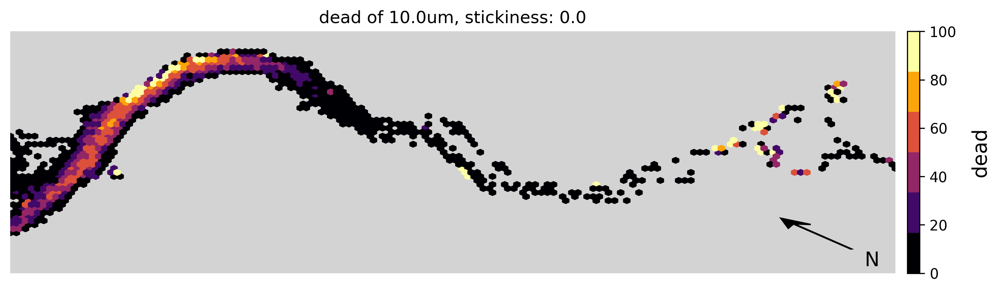

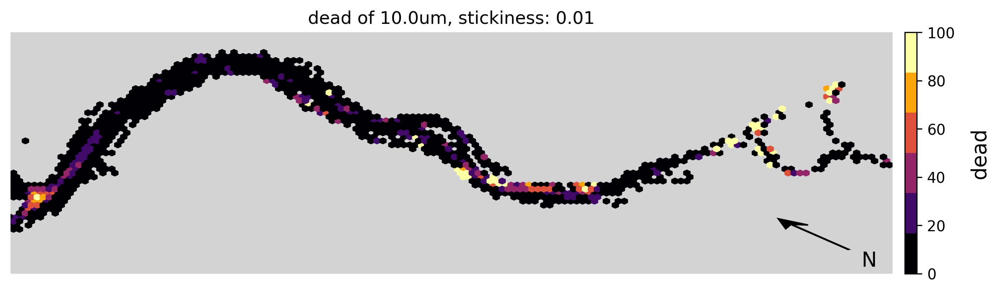

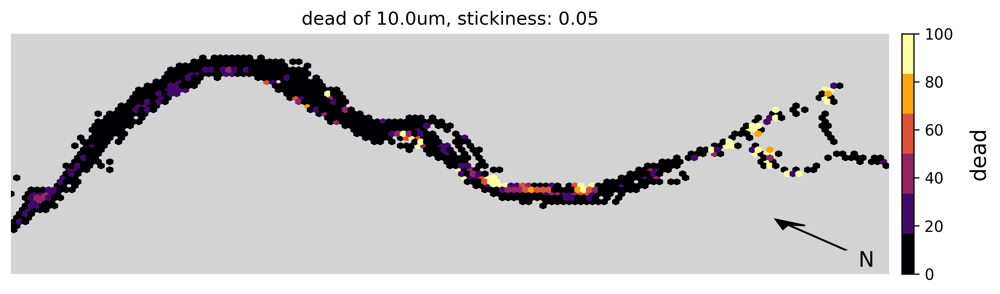

In [11]:
for ii in [0,1,2]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_death(case,num_bins=30,vmax=100)

In [16]:
for ii in [0,1,2]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

### illumination maps

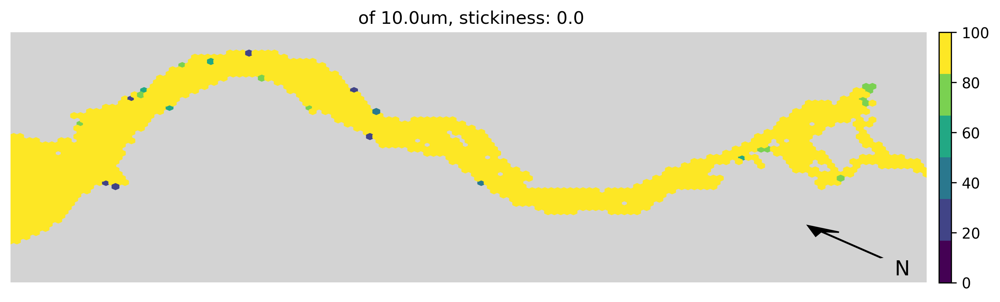

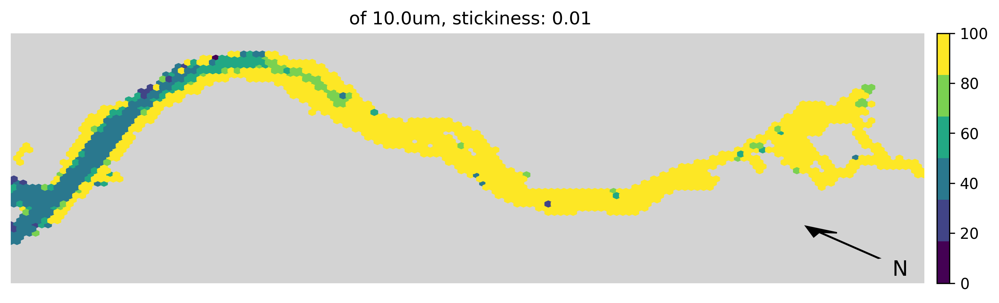

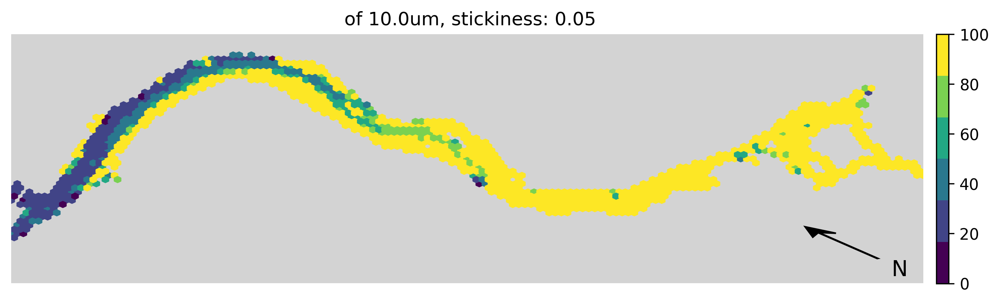

In [ ]:
for ii in [0,1,2]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

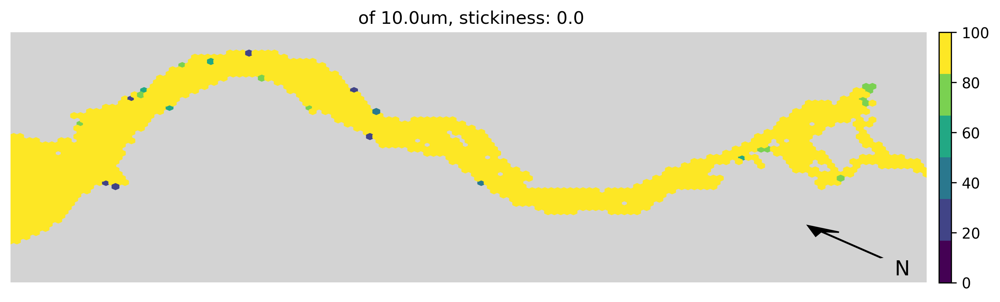

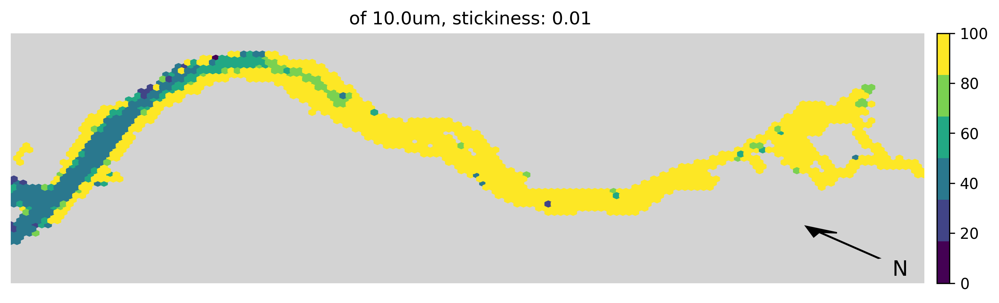

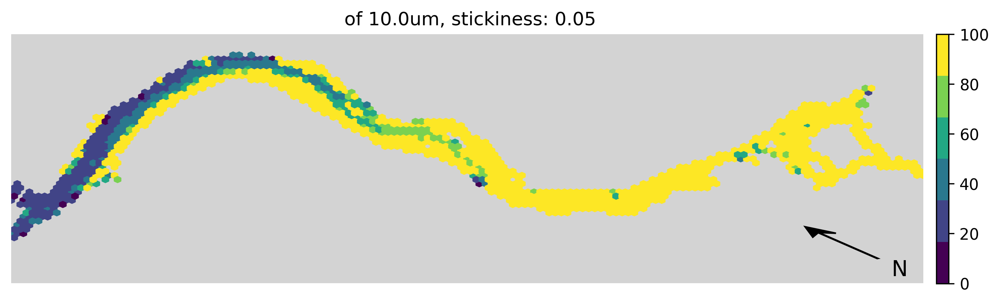

In [9]:
for ii in [0,1,2]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

### cause of death ratios

In [10]:
print(f'\t\t| dryout\t | salinity\t  | illumination   | alive\t    | dead \t     |')

for ii in range(3):
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    case_info = read_case_info_file(case)
    r = case_info['full_case_params']['class_dicts']['particle_properties']['radius_spherical']['initial_value']
    a = case_info['full_case_params']['class_dicts']['particle_properties']['collision_very_fine_silt']['stickyness']


    cause_of_death = track_data['cause_of_death']

    cause_of_death = cause_of_death[-1,:]

    # count of particles that died due to [dryout, salinity, illumination]
    count_dryout = np.sum(cause_of_death == 3)
    count_salinity = np.sum(cause_of_death == 1)
    count_illumination = np.sum(cause_of_death == 2)

    count_alive = np.sum(cause_of_death == 0)
    count_dead = np.sum(cause_of_death != 0)

    print(f'r={r:1.0e} s={a:1.2f}\t| {count_dryout:14.0f} | {count_salinity:14.0f} | {count_illumination:14.0f} | {count_alive:14.0f} | {count_dead:14.0f} |')

    

		| dryout	 | salinity	  | illumination   | alive	    | dead 	     |
r=1e-05 s=0.00	|            350 |          22854 |           6717 |          22640 |          29921 |
r=1e-05 s=0.01	|           2807 |           2831 |          15035 |          31888 |          20673 |
r=1e-05 s=0.05	|           2901 |           1080 |          16375 |          32205 |          20356 |


In [4]:
import pandas as pd

data = {
    'r': [1e-05, 1e-05, 1e-05],
    's': [0.00, 0.01, 0.05],
    'dryout': [350, 2807, 2901],
    'salinity': [22854, 2831, 1080],
    'illumination': [6717, 15035, 16375],
    'alive': [22640, 31888, 32205],
    'dead': [29921, 20673, 20356]
}

df = pd.DataFrame(data)

print(df)

         r     s  dryout  salinity  illumination  alive   dead
0  0.00001  0.00     350     22854          6717  22640  29921
1  0.00001  0.01    2807      2831         15035  31888  20673
2  0.00001  0.05    2901      1080         16375  32205  20356


In [5]:
# normalized dryout, salinity, illumination by "dead" to get the ratio of causes of death
df['dryout_normalized'] = df['dryout'] / df['dead']
df['salinity_normalized'] = df['salinity'] / df['dead']
df['illumination_normalized'] = df['illumination'] / df['dead']

In [6]:
# slice for first and second row (0, 0.01)
df_comparison = df.iloc[0:2, :]
df_comparison

,r,s,dryout,salinity,illumination,alive,dead,dryout_normalized,salinity_normalized,illumination_normalized
0,0.00001,0.00,350,22854,6717,22640,29921,0.011697,0.763811,0.224491
1,0.00001,0.01,2807,2831,15035,31888,20673,0.135781,0.136942,0.727277


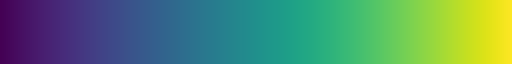

In [6]:
sns.color_palette("viridis", as_cmap=True)

/tmp/ipykernel_26197/1061319747.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ = ax.set_yticklabels(['{:,.0%}'.format(x) for x in ax.get_yticks()])


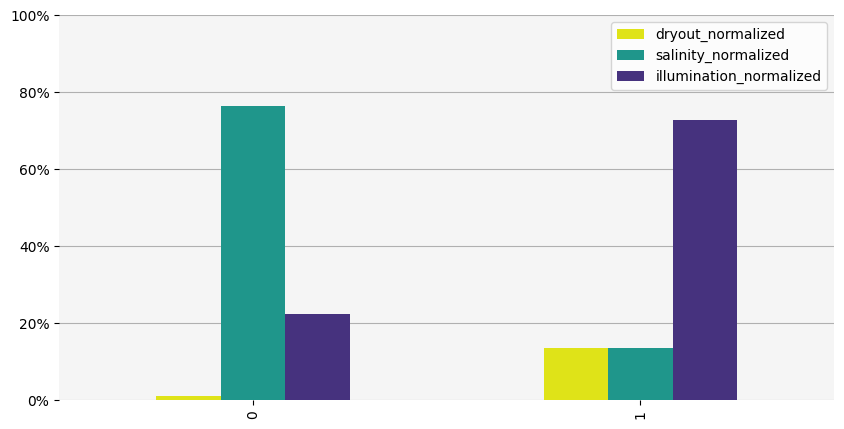

In [41]:
# make barplot to compare case 0 and case 1 and plot dryout, salinity and illumination
fig,ax = plt.subplots(1,1,figsize=(10,5))

colors = sns.color_palette("viridis", n_colors=20)

# set colors[0] for dryout, colors[1] for salinity, colors[2] for illumination
df_comparison[['dryout_normalized', 'salinity_normalized', 'illumination_normalized']].plot(kind='bar', ax=ax, color=[colors[19], colors[10], colors[2]])

# remove all spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# make plot background light gray
# ax.set_facecolor('lightgray')
# even lighter
ax.set_facecolor('whitesmoke')

# add horizontal grid lines
ax.yaxis.grid(True)
# make grid lines dashed and white
# ax.yaxis.grid(True, linestyle='--', color='white')
# put gridlines  behind bar plot
ax.set_axisbelow(True)

# set xlim 0, 1
ax.set_ylim(0, 1)

# turn yaxis in percent
_ = ax.set_yticklabels(['{:,.0%}'.format(x) for x in ax.get_yticks()])

# remove x label
ax.set_xlabel('')

# remove white figure background (not the facecolor of the plot)
fig.patch.set_facecolor('none')



In [31]:
# visualize changes between case 0 and case 1

# create empty dataframe
df_changes = pd.DataFrame()

# calculate changes between case 0 and case 1
df_changes['dryout_diff'] = df_comparison['dryout_normalized'].diff()
df_changes['salinity_diff'] = df_comparison['salinity_normalized'].diff()
df_changes['illumination_diff'] = df_comparison['illumination_normalized'].diff()

# drop first row
df_changes = df_changes.dropna()

# express diff as relative changes
df_changes['dryout_diff_rel'] = df_changes['dryout_diff'] / df_comparison['dryout_normalized'].iloc[0]
df_changes['salinity_diff_rel'] = df_changes['salinity_diff'] / df_comparison['salinity_normalized'].iloc[0]
df_changes['illumination_diff_rel'] = df_changes['illumination_diff'] / df_comparison['illumination_normalized'].iloc[0]

df_changes

,dryout_diff,salinity_diff,illumination_diff,dryout_diff_rel,salinity_diff_rel,illumination_diff_rel
1,0.124084,-0.626869,0.502786,10.607721,-0.820712,2.239669


/tmp/ipykernel_26197/4060242130.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  _ = ax.set_yticklabels(['{:,.0%}'.format(x) for x in ax.get_yticks()])


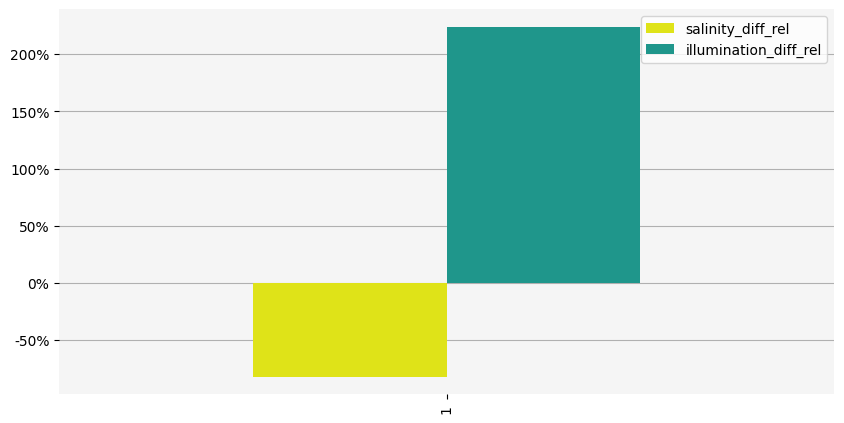

In [35]:
fig,ax = plt.subplots(1,1,figsize=(10,5))

colors = sns.color_palette("viridis", n_colors=20)

# set colors[0] for dryout, colors[1] for salinity, colors[2] for illumination
df_changes[['salinity_diff_rel', 'illumination_diff_rel']].plot(kind='bar', ax=ax, color=[colors[19], colors[10], colors[2]])

# remove all spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# make plot background light gray
# ax.set_facecolor('lightgray')
# even lighter
ax.set_facecolor('whitesmoke')

# add horizontal grid lines
ax.yaxis.grid(True)
# make grid lines dashed and white
# ax.yaxis.grid(True, linestyle='--', color='white')
# put gridlines  behind bar plot
ax.set_axisbelow(True)

# turn yaxis in percent
_ = ax.set_yticklabels(['{:,.0%}'.format(x) for x in ax.get_yticks()])

## v36

In [5]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v36'

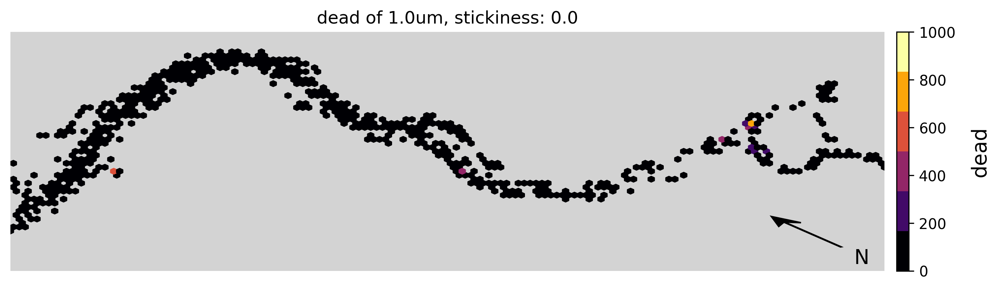

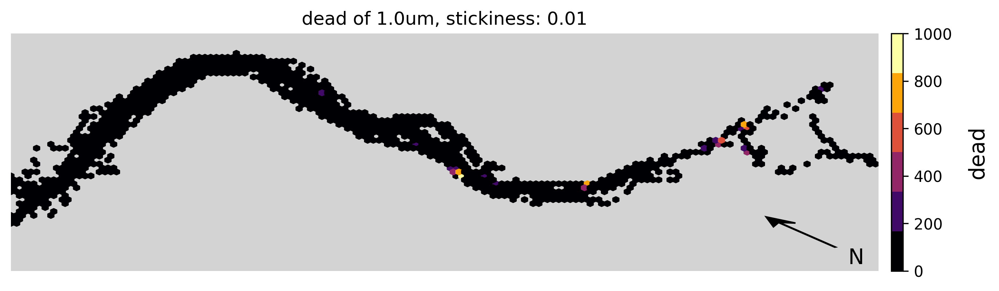

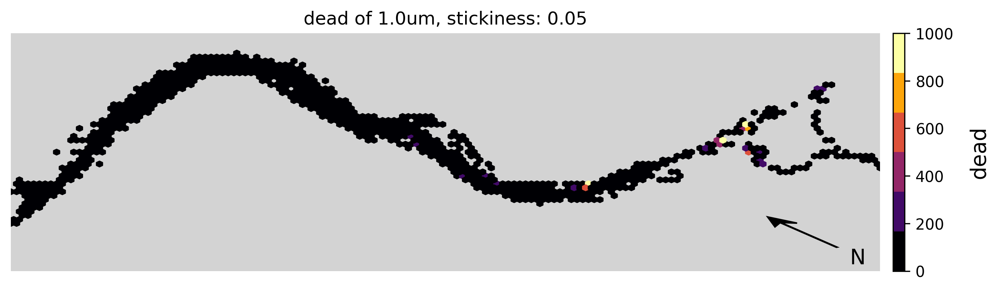

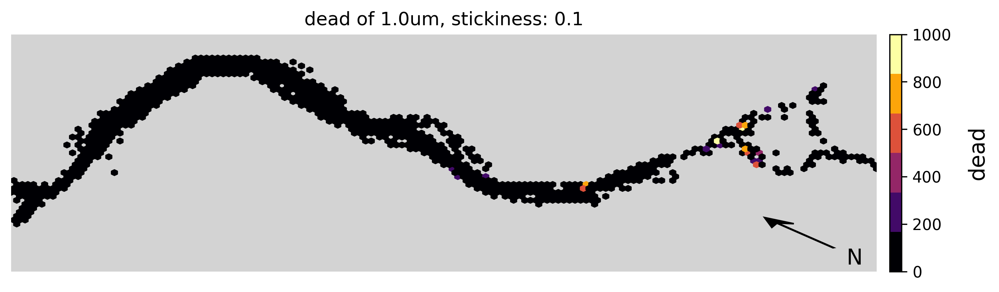

In [6]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_death(case)

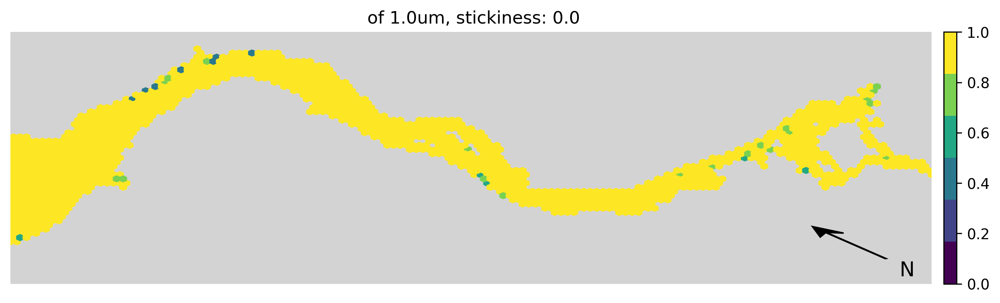

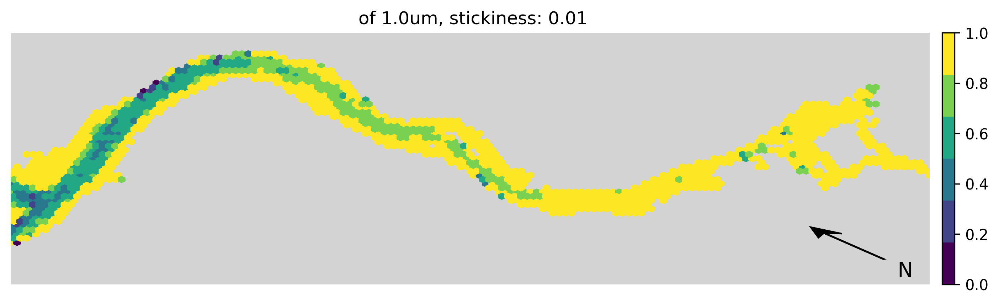

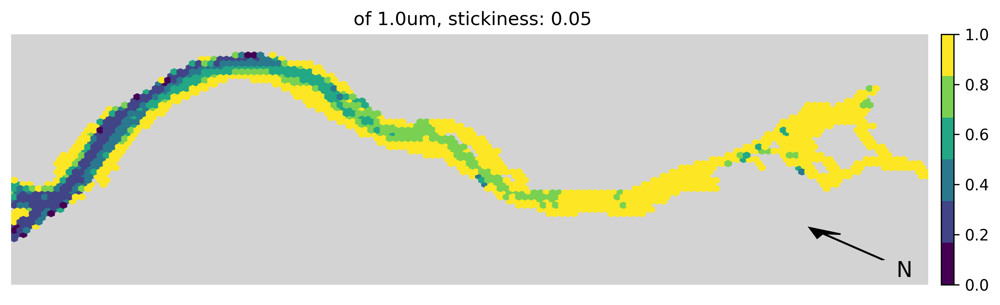

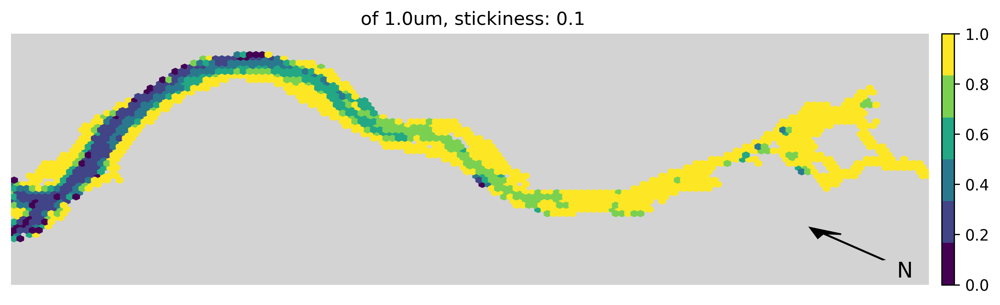

In [6]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

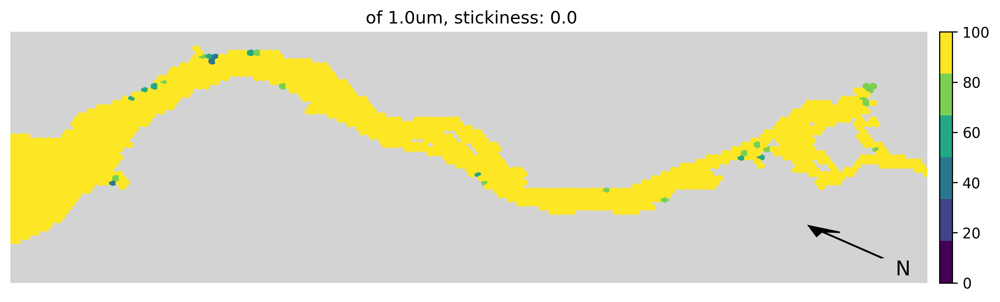

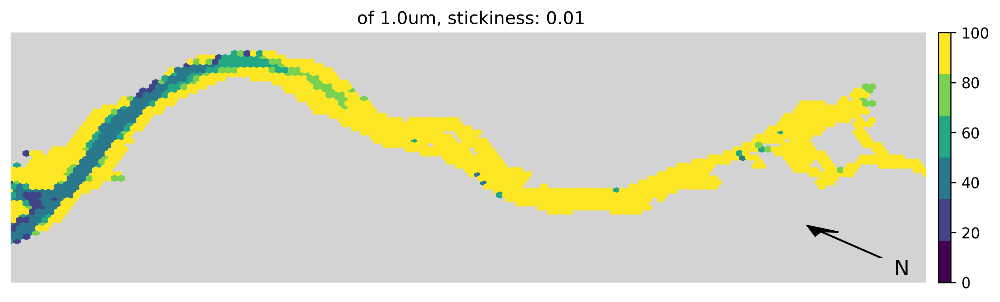

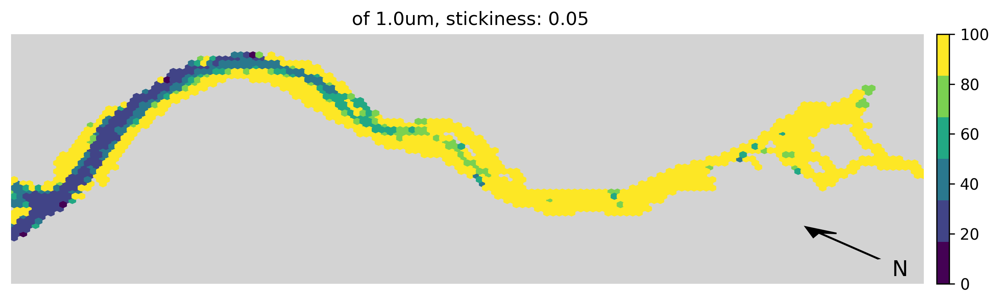

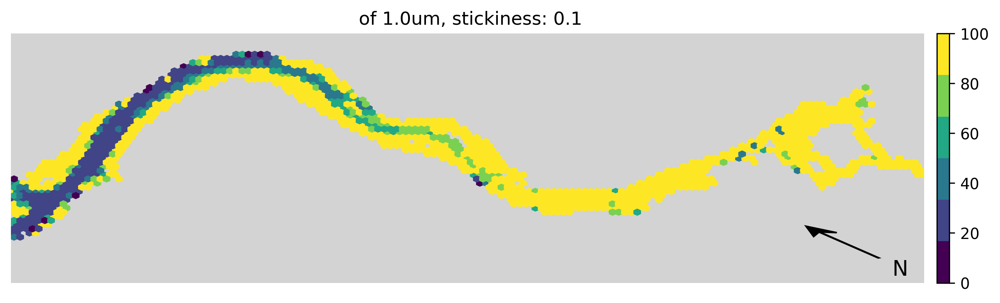

In [7]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

In [8]:
print(f'\t\t| dryout\t | salinity\t  | illumination   | alive\t    | dead \t     |')

for ii in range(12):
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    case_info = read_case_info_file(case)
    r = case_info['full_case_params']['class_dicts']['particle_properties']['radius_spherical']['initial_value']
    a = case_info['full_case_params']['class_dicts']['particle_properties']['collision_very_fine_silt']['stickyness']


    cause_of_death = track_data['cause_of_death']

    cause_of_death = cause_of_death[-1,:]

    # count of particles that died due to [dryout, salinity, illumination]
    count_dryout = np.sum(cause_of_death == 3)
    count_salinity = np.sum(cause_of_death == 1)
    count_illumination = np.sum(cause_of_death == 2)

    count_alive = np.sum(cause_of_death == 0)
    count_dead = np.sum(cause_of_death != 0)

    print(f'r={r:1.0e} s={a:1.2f}\t| {count_dryout:14.0f} | {count_salinity:14.0f} | {count_illumination:14.0f} | {count_alive:14.0f} | {count_dead:14.0f} |')

    

		| dryout	 | salinity	  | illumination   | alive	    | dead 	     |
r=1e-05 s=0.00	|            350 |          22854 |           6717 |          22640 |          29921 |
r=1e-05 s=0.01	|           2807 |           2831 |          15035 |          31888 |          20673 |
r=1e-05 s=0.05	|           2901 |           1080 |          16375 |          32205 |          20356 |


IndexError: list index out of range

## v35

In [30]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v35'

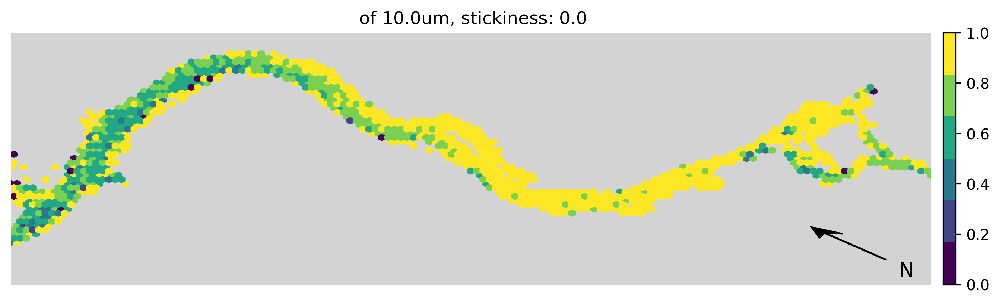

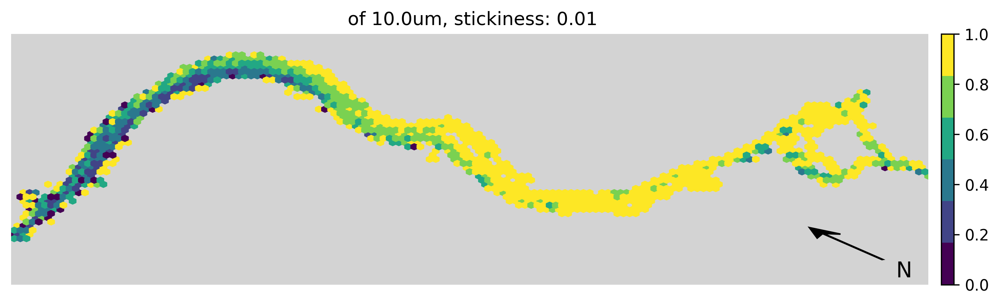

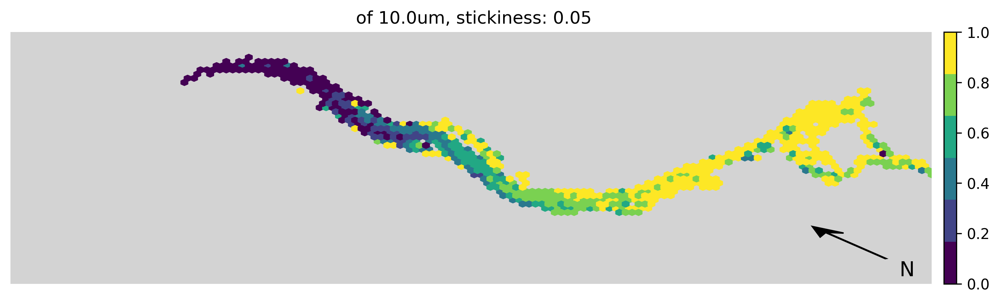

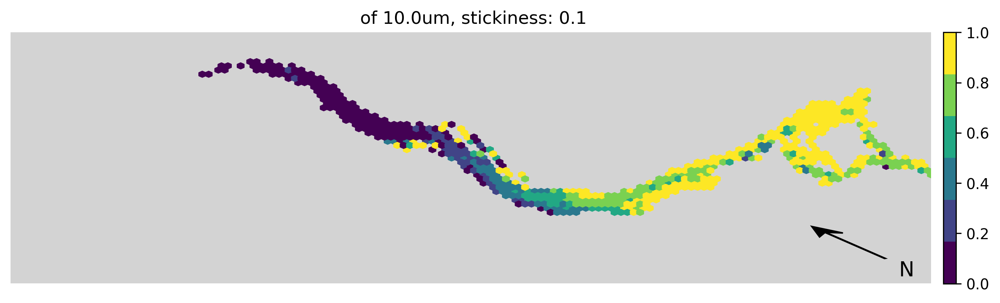

In [31]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

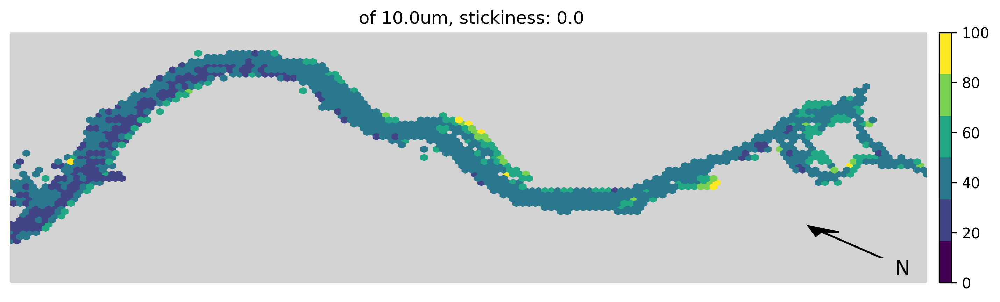

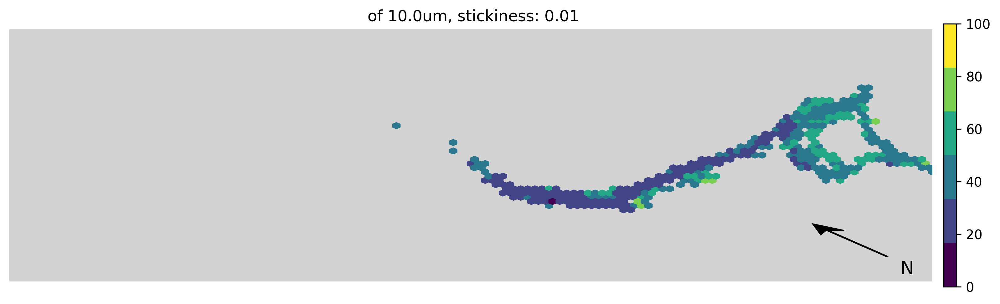

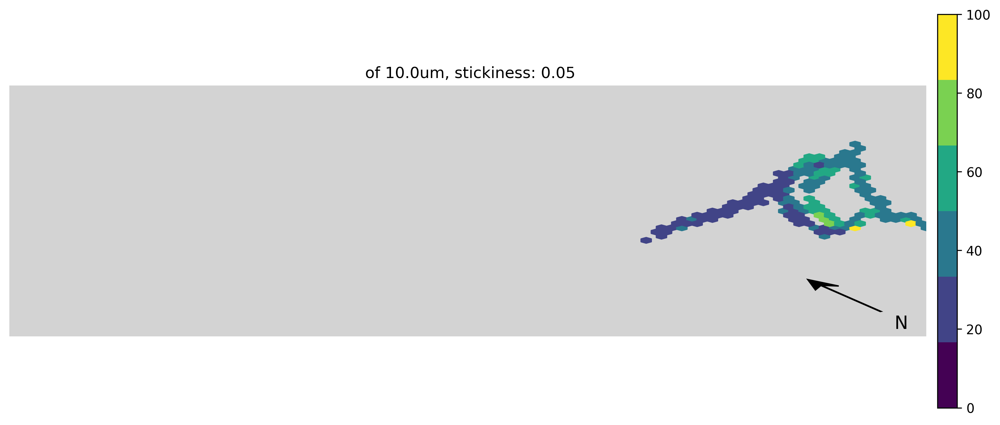

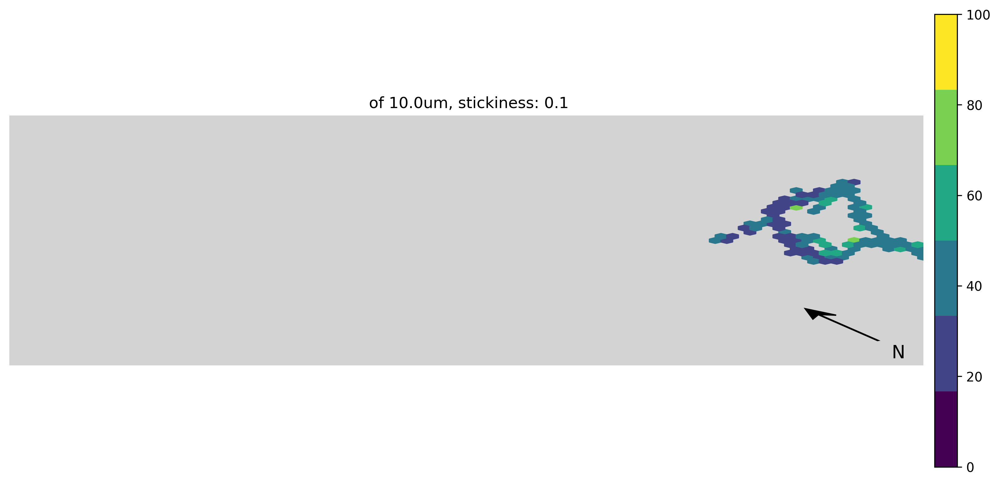

In [12]:

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

Loaded data
Sliced data
Projected data
[1682, 1194, 889, 908, 680, 750, 956, 681, 650, 611, 1142, 1044, 2502, 2378, 1624, 597, 390, 413, 2001, 746, 572, 812, 1662, 1714, 688, 952, 865, 1956, 1374, 1109, 949, 1021, 1098, 1239, 1080, 1071, 1451, 1014, 1711, 873, 938, 1130, 1196, 1436, 1114, 1309, 1329, 1052, 2100, 1522, 1726, 1364, 1391, 1796, 1013, 980, 1108, 1123, 967, 1068, 1150, 1020, 1006, 1284, 872, 925, 803, 549, 534, 510, 563, 485, 512, 400, 416, 334, 438, 304, 313, 305, 306, 252, 288, 238, 183, 174, 181, 193, 182, 141, 103, 79, 72, 90, 73, 64, 48, 54, 46, 31]
Binned data
Loaded data
Sliced data
Projected data
[1638, 1173, 905, 893, 750, 735, 1131, 554, 622, 571, 987, 1051, 1046, 4074, 1463, 725, 395, 425, 1894, 1008, 586, 721, 1684, 1781, 684, 921, 879, 1914, 1219, 1010, 1108, 948, 1094, 1132, 1202, 1068, 1399, 1007, 1751, 1012, 896, 1032, 1168, 1181, 1240, 1098, 1273, 1069, 1687, 1584, 1455, 1528, 1322, 1911, 1165, 1031, 1008, 1108, 979, 1130, 1044, 1119, 943, 1045, 1030, 1023,

/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/oceantracker/post_processing/plotting/plot_collapse.py:224: RuntimeWarning: Mean of empty slice.
  mean_distance = np.array([distance_downstream[bin_indices == i].mean() for i in range(num_bins)])
/home/zmaw/u301513/.conda/envs/oceantracker/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


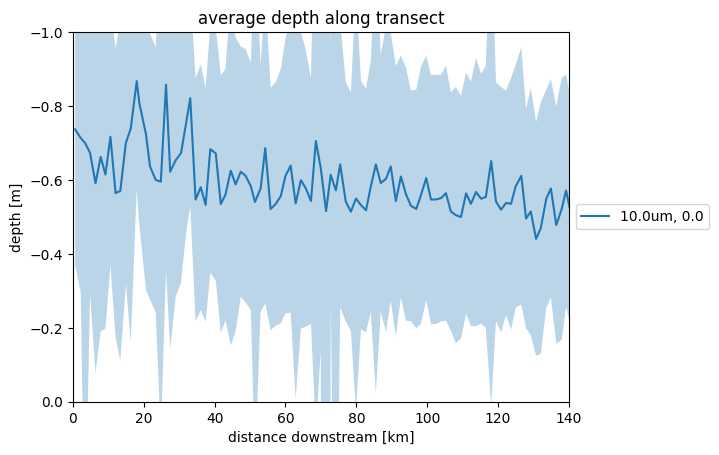

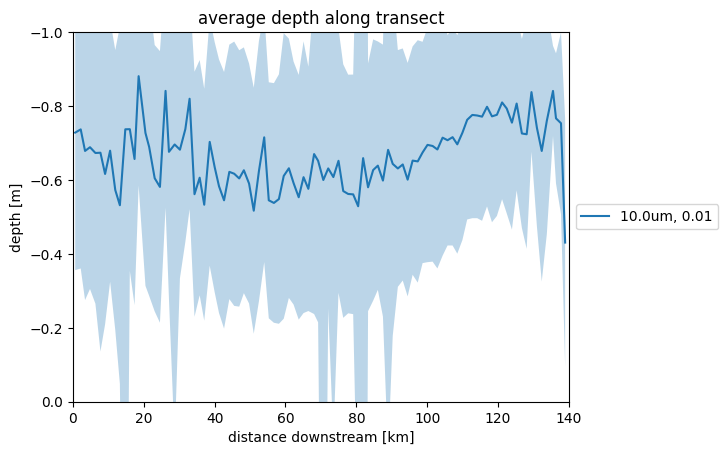

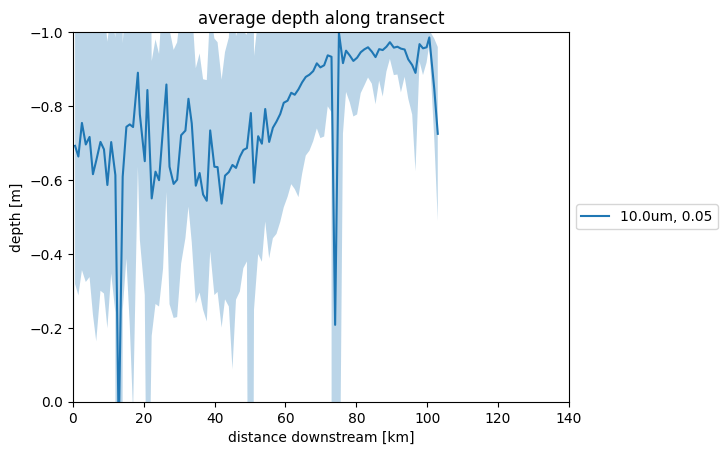

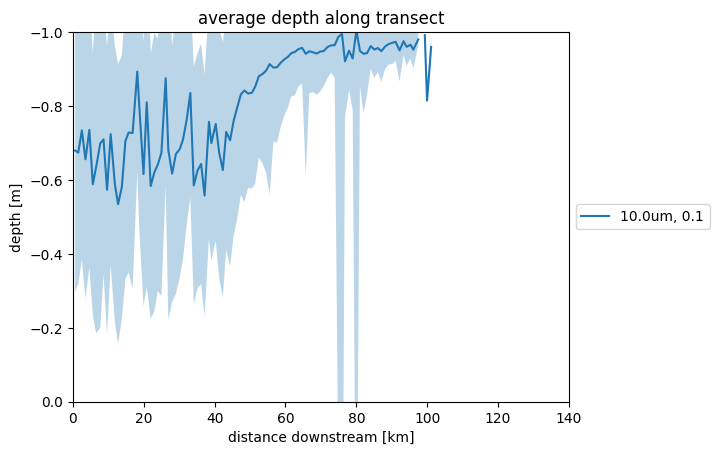

In [36]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_relative_depth_along_transect(norder_elbe, case)

Loaded data
Sliced data
Projected data
[1682, 1194, 889, 908, 680, 750, 956, 681, 650, 611, 1142, 1044, 2502, 2378, 1624, 597, 390, 413, 2001, 746, 572, 812, 1662, 1714, 688, 952, 865, 1956, 1374, 1109, 949, 1021, 1098, 1239, 1080, 1071, 1451, 1014, 1711, 873, 938, 1130, 1196, 1436, 1114, 1309, 1329, 1052, 2100, 1522, 1726, 1364, 1391, 1796, 1013, 980, 1108, 1123, 967, 1068, 1150, 1020, 1006, 1284, 872, 925, 803, 549, 534, 510, 563, 485, 512, 400, 416, 334, 438, 304, 313, 305, 306, 252, 288, 238, 183, 174, 181, 193, 182, 141, 103, 79, 72, 90, 73, 64, 48, 54, 46, 31]
Binned data
Loaded data
Sliced data
Projected data
[1638, 1173, 905, 893, 750, 735, 1131, 554, 622, 571, 987, 1051, 1046, 4074, 1463, 725, 395, 425, 1894, 1008, 586, 721, 1684, 1781, 684, 921, 879, 1914, 1219, 1010, 1108, 948, 1094, 1132, 1202, 1068, 1399, 1007, 1751, 1012, 896, 1032, 1168, 1181, 1240, 1098, 1273, 1069, 1687, 1584, 1455, 1528, 1322, 1911, 1165, 1031, 1008, 1108, 979, 1130, 1044, 1119, 943, 1045, 1030, 1023,

/home/zmaw/u301513/Documents/scr/phd/bicest/oceantracker/oceantracker/post_processing/plotting/plot_collapse.py:153: RuntimeWarning: Mean of empty slice.
  mean_distance = np.array([distance_downstream[bin_indices == i].mean() for i in range(num_bins)])


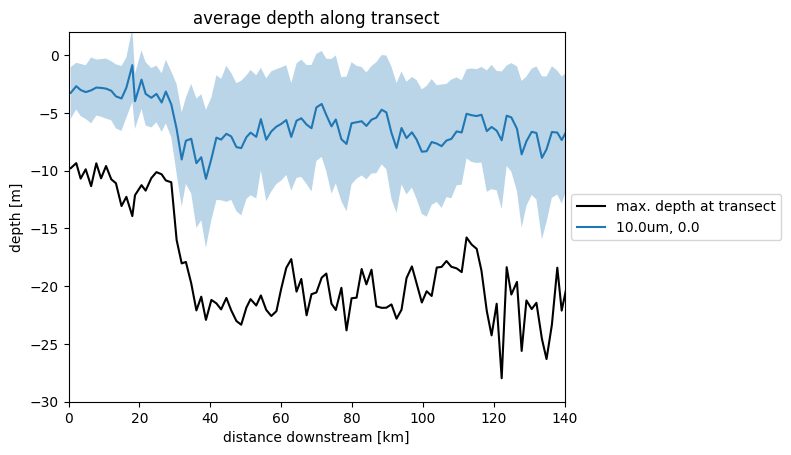

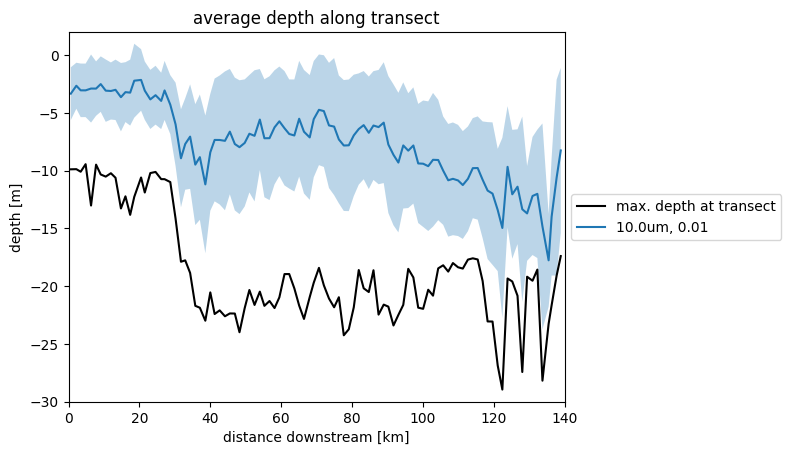

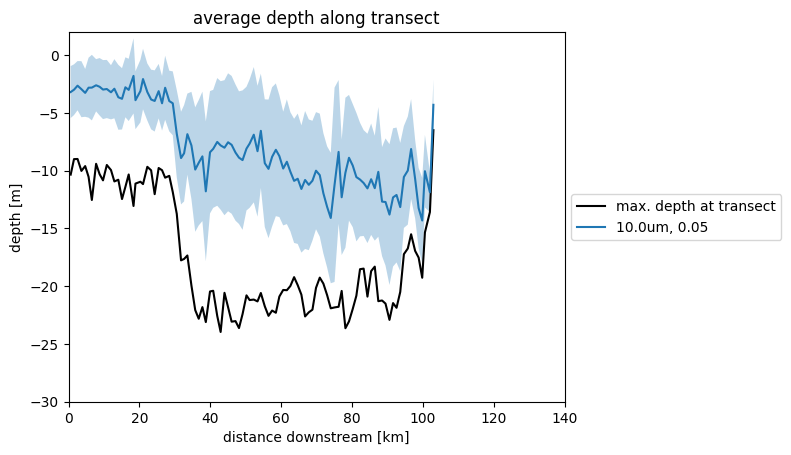

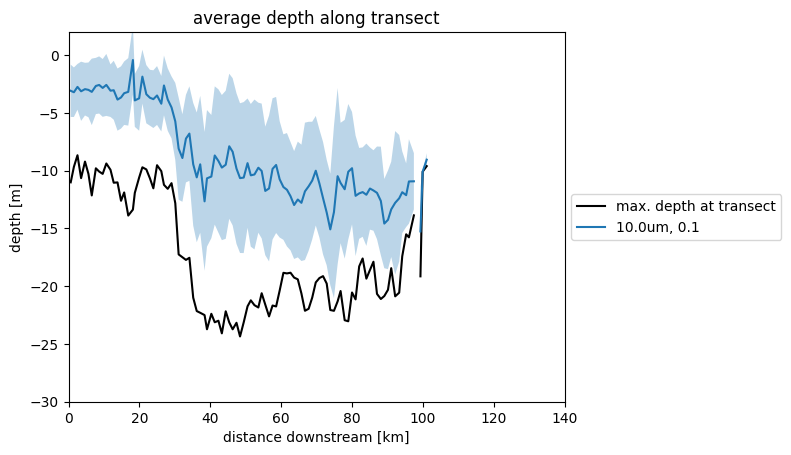

In [37]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_depth_along_transect(norder_elbe, case)

Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
1066
965
746
659
545
710
787
514
514
485
777
868
1350
1485
1619
424
464
585
1533
464
540
787
1502
1074
839
1149
1035
2320
1408
1281
1090
1348
1464
1621
1261
1928
1321
1578
1921
1137
1339
1612
1422
1591
1492
1488
1370
1417
2592
1377
1576
1354
1953
1627
1443
1413
1395
1328
1544
1459
1374
1319
1172
1338
1273
1216
1239
909
1032
901
969
881
882
805
700
675
572
569
538
559
518
474
525
385
322
318
373
430
295
241
215
143
171
155
183
147
1

KeyError: 'density'

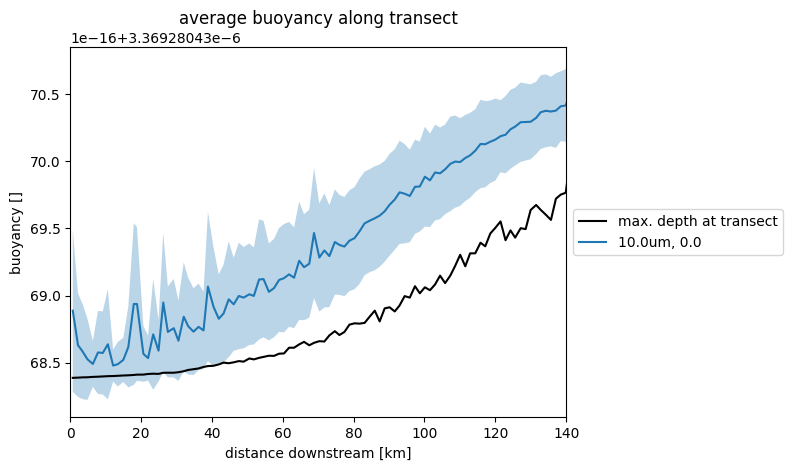

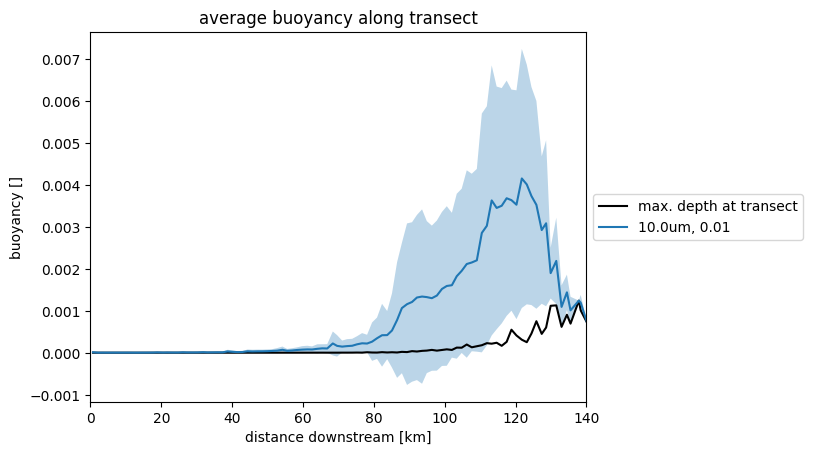

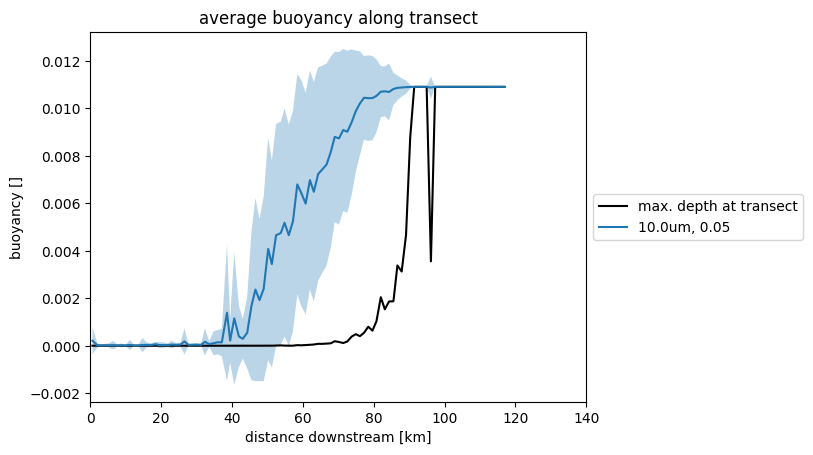

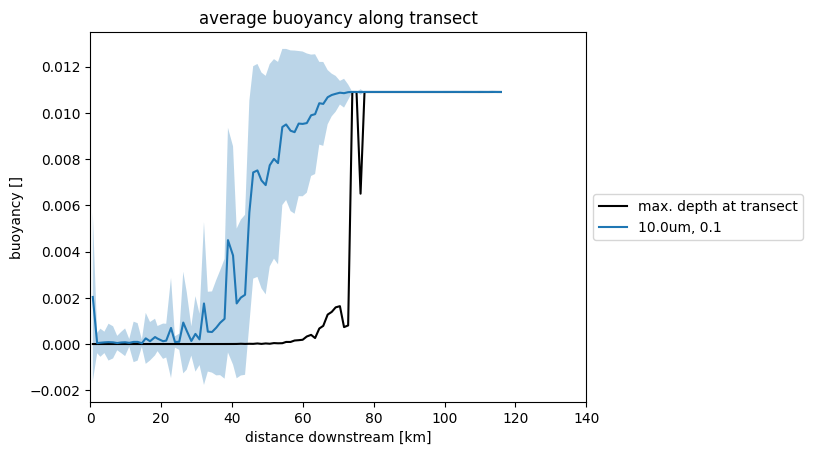

In [ ]:
for part_prop in ['buoyancy','density','radius',]:
    for ii in [0,1,2,3]:
        case = get_case_info_files_from_dir(path_to_dir)[ii]
        plot_part_prop_along_transect(norder_elbe, case,part_prop)


In [ ]:
print(f'| dryout \t| salinity \t| illumination \t| alive \t| dead \t|')

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    cause_of_death = track_data['cause_of_death']

    cause_of_death = cause_of_death[-1,:]

    # count of particles that died due to [dryout, salinity, illumination]
    count_dryout = np.sum(cause_of_death == 3)
    count_salinity = np.sum(cause_of_death == 1)
    count_illumination = np.sum(cause_of_death == 2)

    count_alive = np.sum(cause_of_death == 0)
    count_dead = np.sum(cause_of_death != 0)

    print(f'| {count_dryout} \t\t| {count_salinity} \t\t| {count_illumination} \t\t| {count_alive} \t\t| {count_dead} \t|')

    

| dryout 	| salinity 	| illumination 	| alive 	| dead 	|
| 4 		| 26 		| 677 		| 19454 		| 707 	|
| 6 		| 1 		| 796 		| 19358 		| 803 	|
| 4 		| 0 		| 923 		| 19234 		| 927 	|
| 3 		| 0 		| 1023 		| 19135 		| 1026 	|


## v34

In [7]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v34'

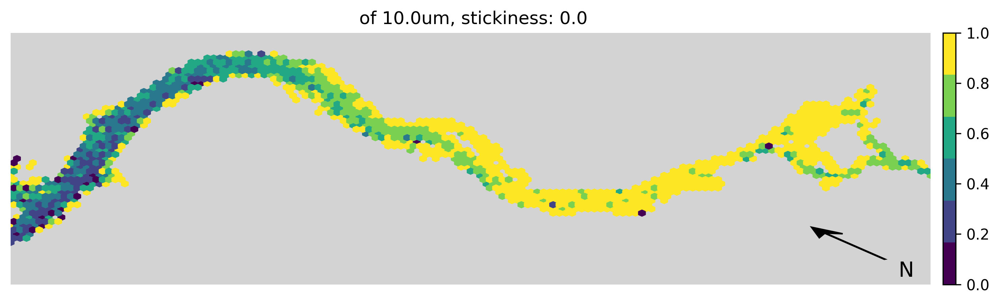

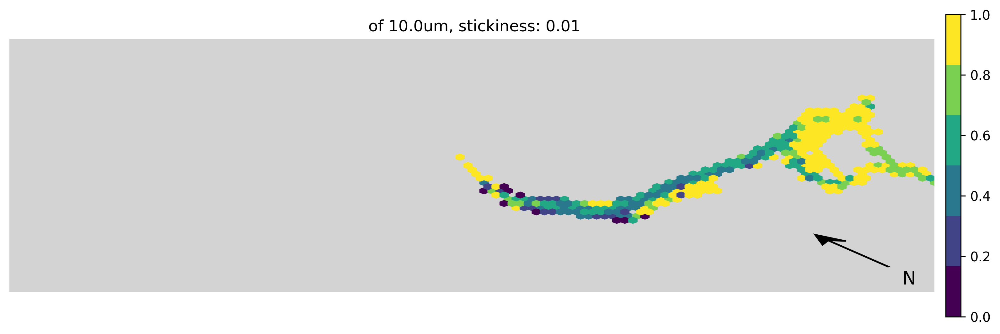

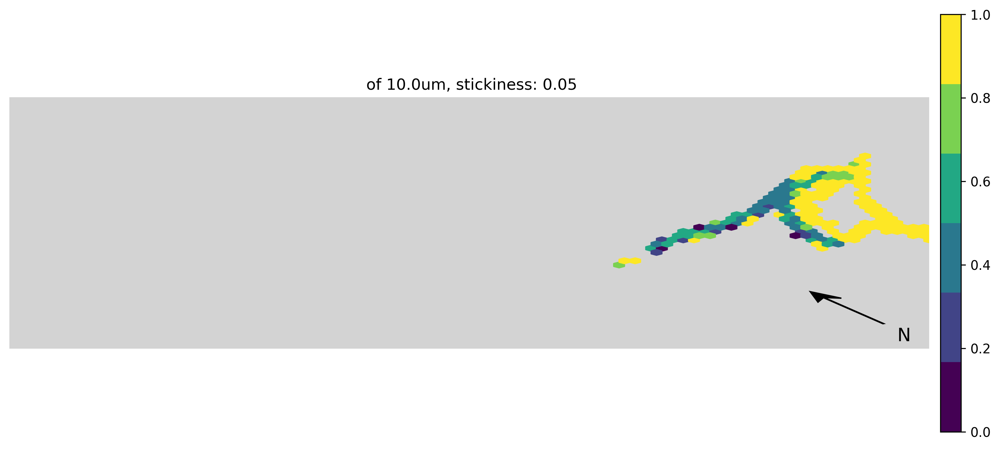

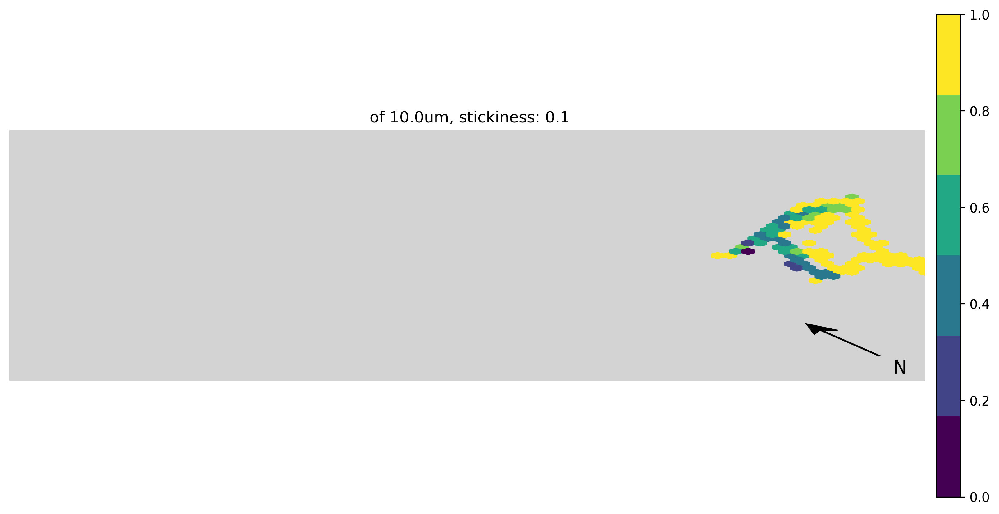

In [8]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

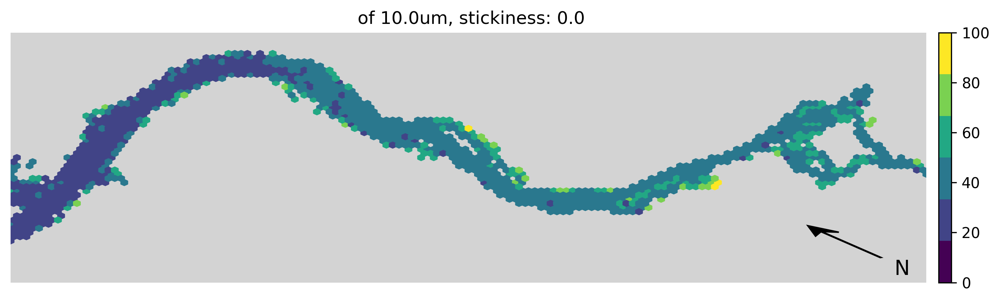

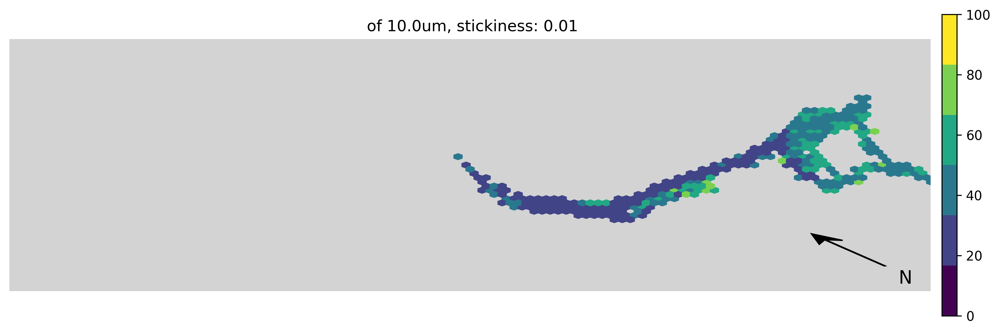

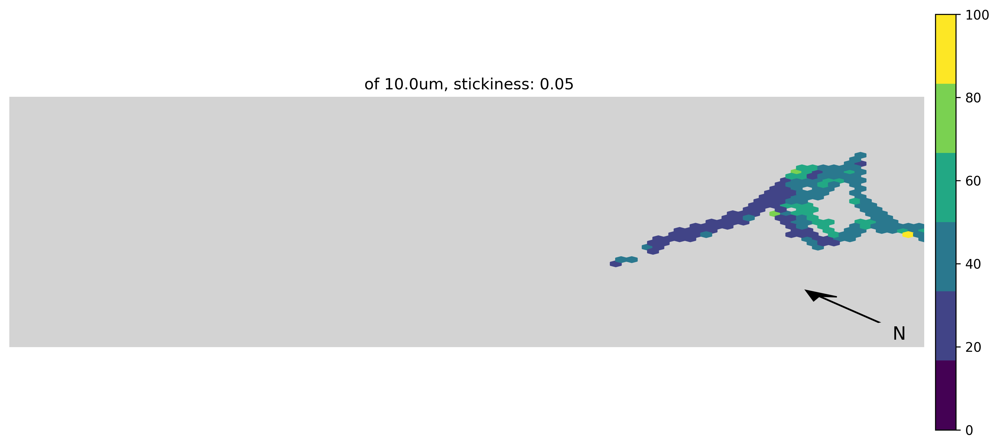

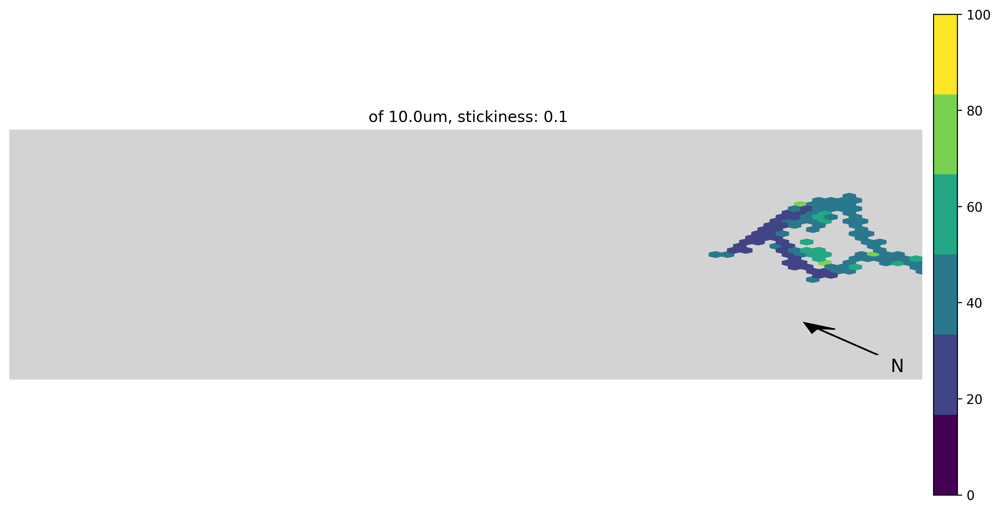

In [9]:

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

Loaded data
Sliced data
Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
Binned data
Loaded data
Sliced data
Projected data
[1028, 882, 796, 686, 524, 683, 928, 512, 533, 505, 789, 883, 1468, 1480, 1560, 569, 359, 496, 1295, 667, 493, 710, 1378, 1300, 752, 1088, 1080, 2331, 1378, 1202, 1115, 1388, 1437, 1554, 1434, 1380, 1956, 1371, 2046, 1222, 1243, 1522, 1454, 1554, 1440, 1383, 1468, 1207, 2473, 1508, 1477, 1442, 1392, 2139, 1506, 1356, 1414, 1362, 1384, 1412, 1481, 1576, 1607,

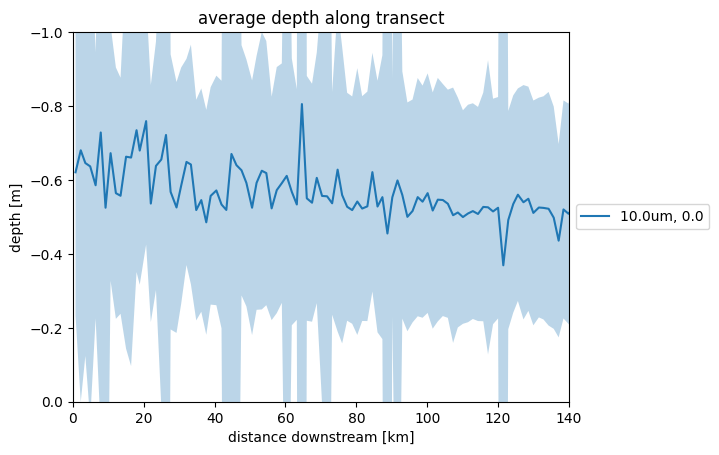

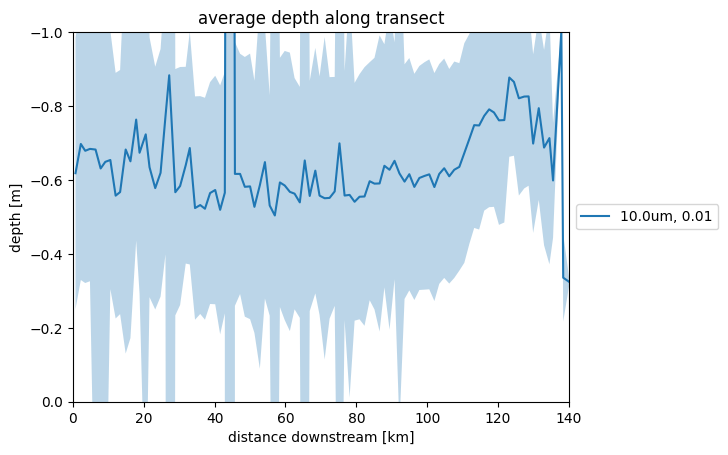

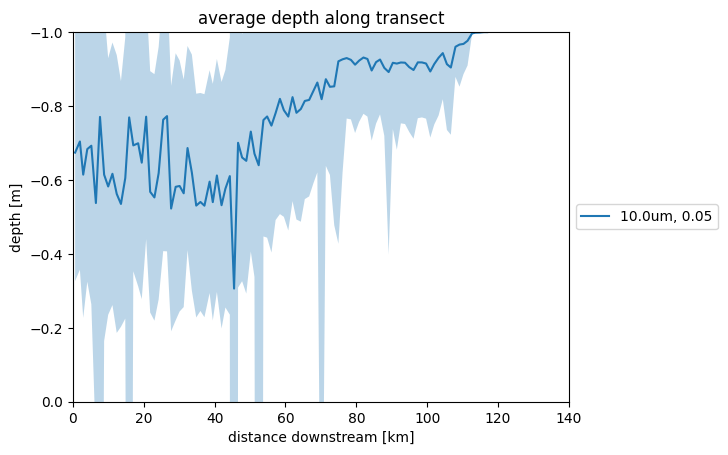

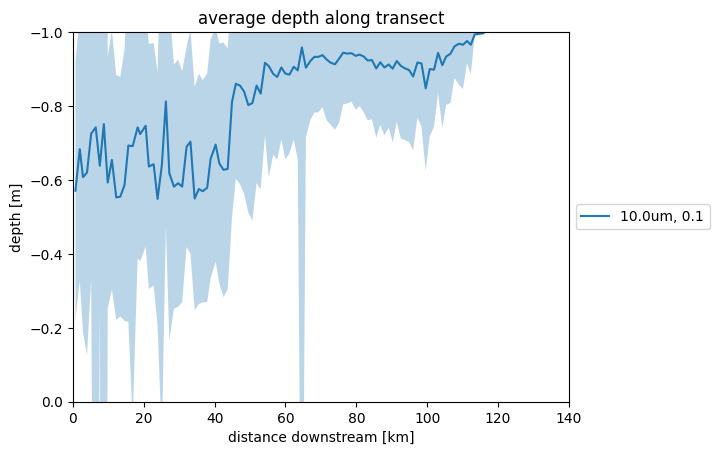

In [ ]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_relative_depth_along_transect(norder_elbe, case)

Loaded data
Sliced data
Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
Binned data
Loaded data
Sliced data
Projected data
[1028, 882, 796, 686, 524, 683, 928, 512, 533, 505, 789, 883, 1468, 1480, 1560, 569, 359, 496, 1295, 667, 493, 710, 1378, 1300, 752, 1088, 1080, 2331, 1378, 1202, 1115, 1388, 1437, 1554, 1434, 1380, 1956, 1371, 2046, 1222, 1243, 1522, 1454, 1554, 1440, 1383, 1468, 1207, 2473, 1508, 1477, 1442, 1392, 2139, 1506, 1356, 1414, 1362, 1384, 1412, 1481, 1576, 1607,

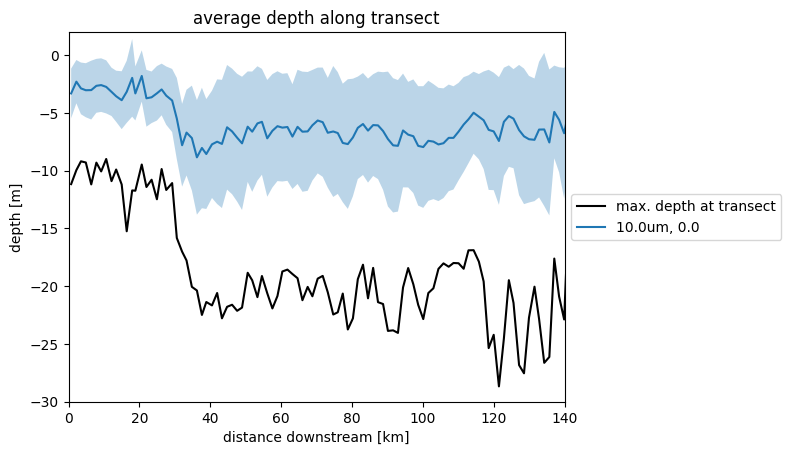

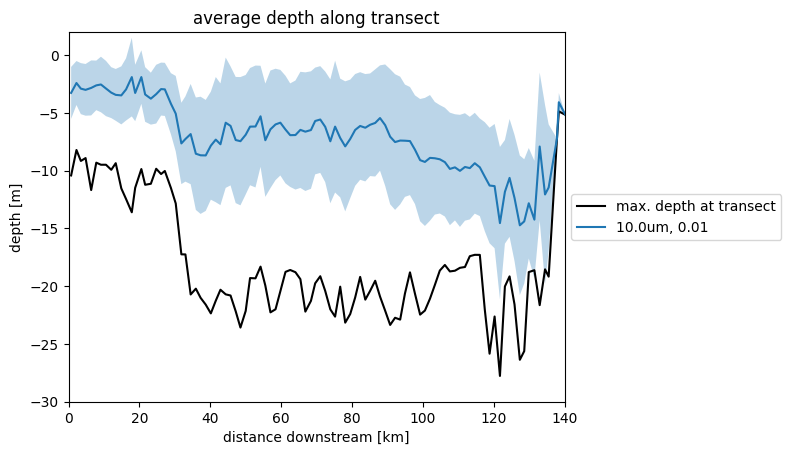

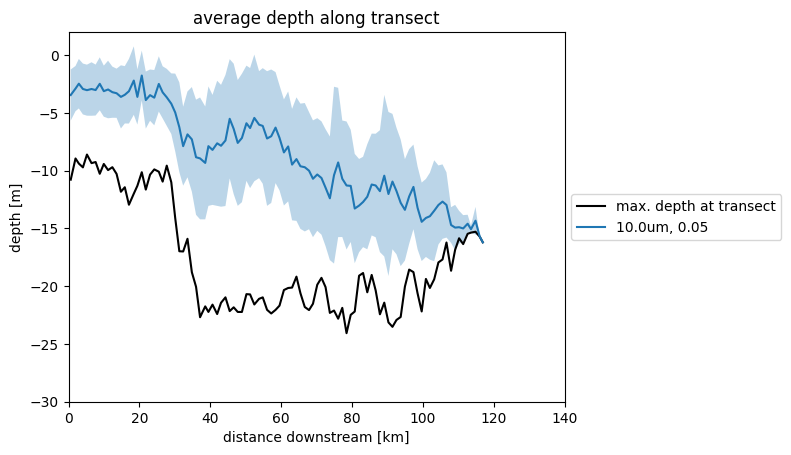

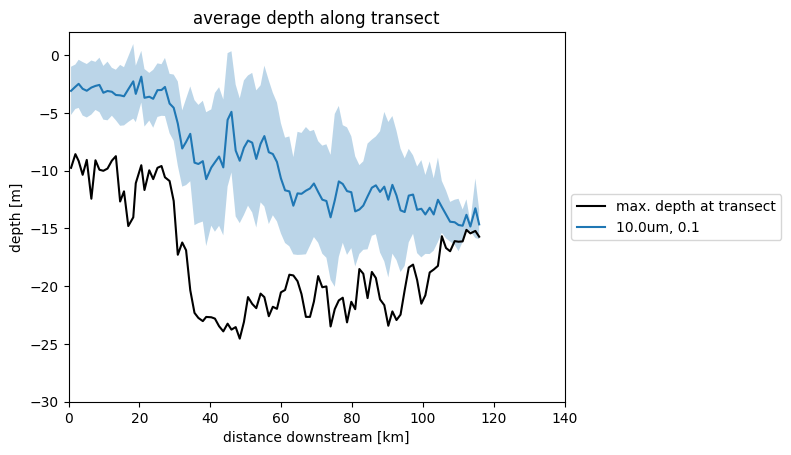

In [ ]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_depth_along_transect(norder_elbe, case)

Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
1066
965
746
659
545
710
787
514
514
485
777
868
1350
1485
1619
424
464
585
1533
464
540
787
1502
1074
839
1149
1035
2320
1408
1281
1090
1348
1464
1621
1261
1928
1321
1578
1921
1137
1339
1612
1422
1591
1492
1488
1370
1417
2592
1377
1576
1354
1953
1627
1443
1413
1395
1328
1544
1459
1374
1319
1172
1338
1273
1216
1239
909
1032
901
969
881
882
805
700
675
572
569
538
559
518
474
525
385
322
318
373
430
295
241
215
143
171
155
183
147
1

KeyError: 'density'

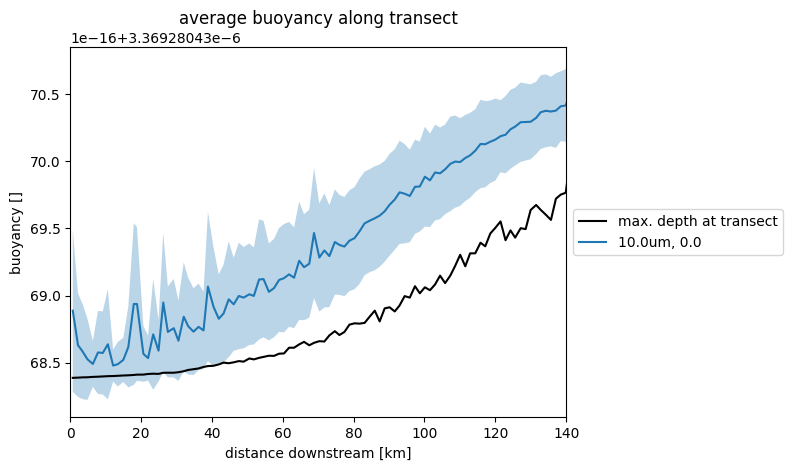

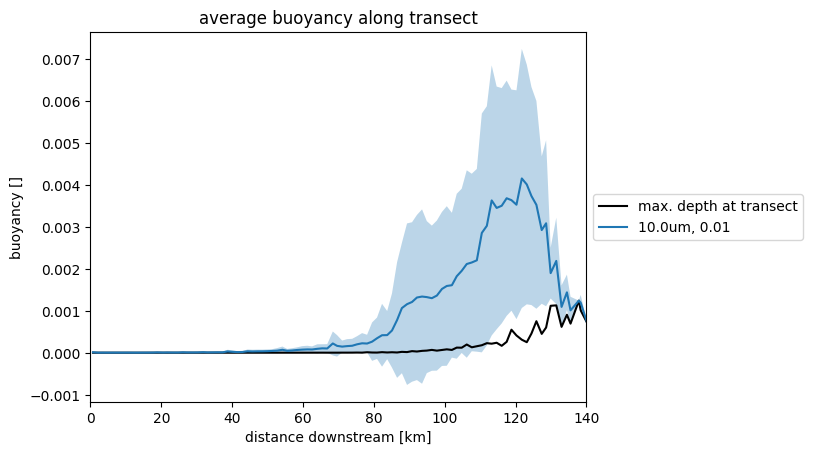

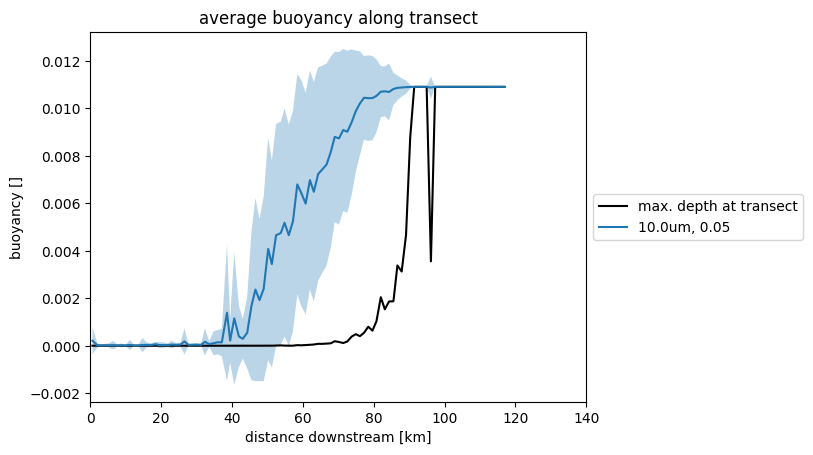

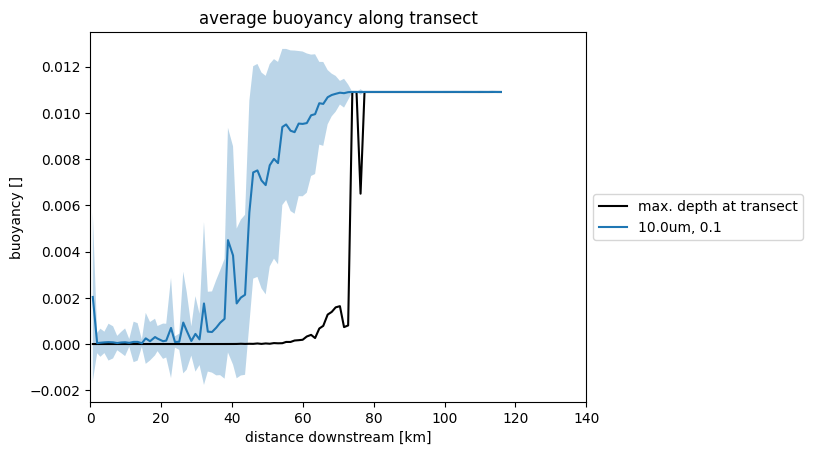

In [ ]:
for part_prop in ['buoyancy','density','radius',]:
    for ii in [0,1,2,3]:
        case = get_case_info_files_from_dir(path_to_dir)[ii]
        plot_part_prop_along_transect(norder_elbe, case,part_prop)


In [ ]:
print(f'| dryout \t| salinity \t| illumination \t| alive \t| dead \t|')

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    cause_of_death = track_data['cause_of_death']

    cause_of_death = cause_of_death[-1,:]

    # count of particles that died due to [dryout, salinity, illumination]
    count_dryout = np.sum(cause_of_death == 3)
    count_salinity = np.sum(cause_of_death == 1)
    count_illumination = np.sum(cause_of_death == 2)

    count_alive = np.sum(cause_of_death == 0)
    count_dead = np.sum(cause_of_death != 0)

    print(f'| {count_dryout} \t\t| {count_salinity} \t\t| {count_illumination} \t\t| {count_alive} \t\t| {count_dead} \t|')

    

| dryout 	| salinity 	| illumination 	| alive 	| dead 	|
| 4 		| 26 		| 677 		| 19454 		| 707 	|
| 6 		| 1 		| 796 		| 19358 		| 803 	|
| 4 		| 0 		| 923 		| 19234 		| 927 	|
| 3 		| 0 		| 1023 		| 19135 		| 1026 	|


## v33

In [2]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v33'

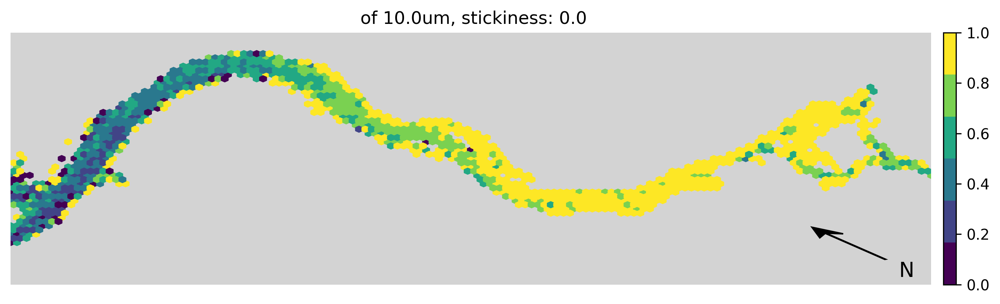

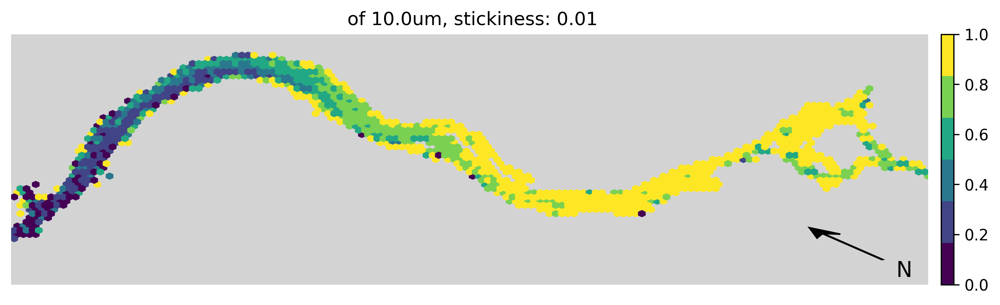

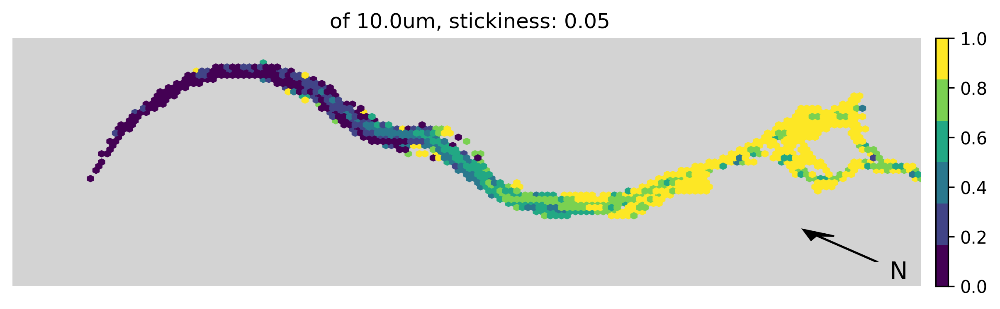

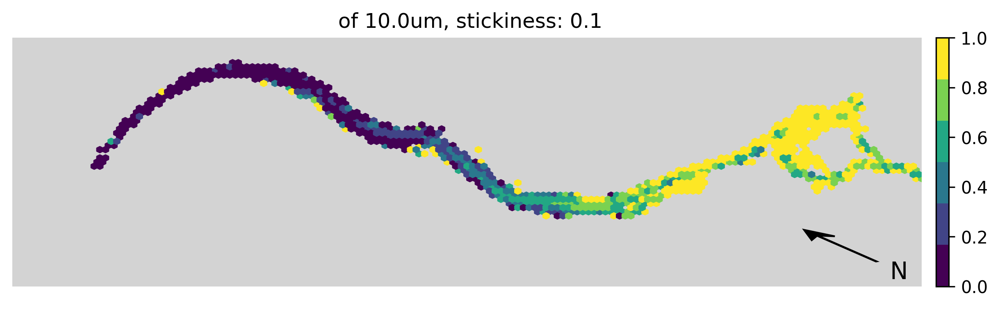

In [3]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

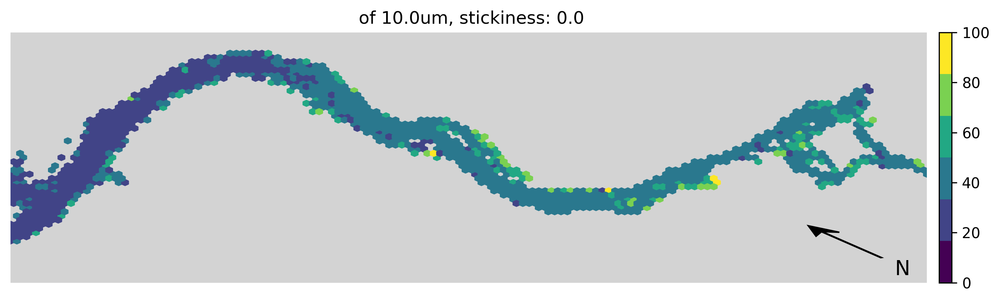

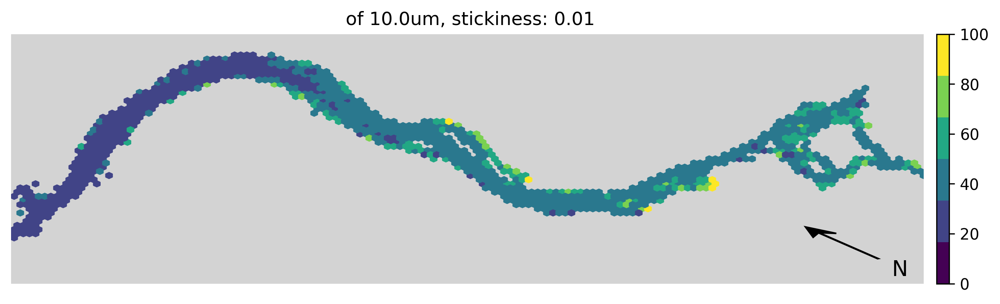

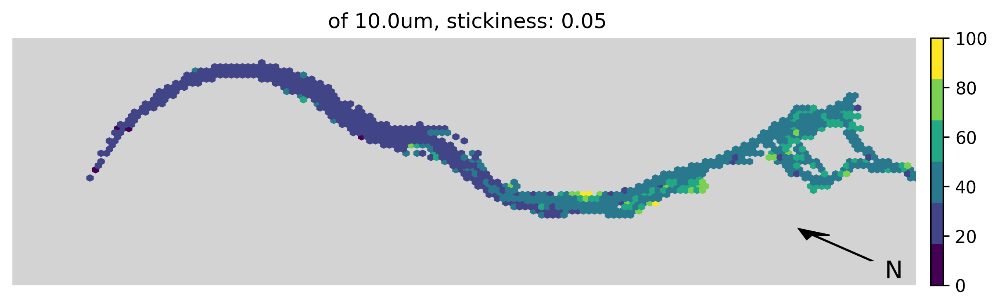

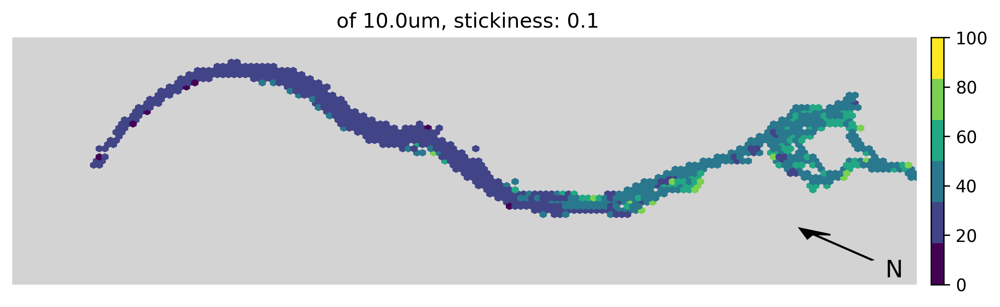

In [4]:

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

Loaded data
Sliced data
Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
Binned data
Loaded data
Sliced data
Projected data
[1028, 882, 796, 686, 524, 683, 928, 512, 533, 505, 789, 883, 1468, 1480, 1560, 569, 359, 496, 1295, 667, 493, 710, 1378, 1300, 752, 1088, 1080, 2331, 1378, 1202, 1115, 1388, 1437, 1554, 1434, 1380, 1956, 1371, 2046, 1222, 1243, 1522, 1454, 1554, 1440, 1383, 1468, 1207, 2473, 1508, 1477, 1442, 1392, 2139, 1506, 1356, 1414, 1362, 1384, 1412, 1481, 1576, 1607,

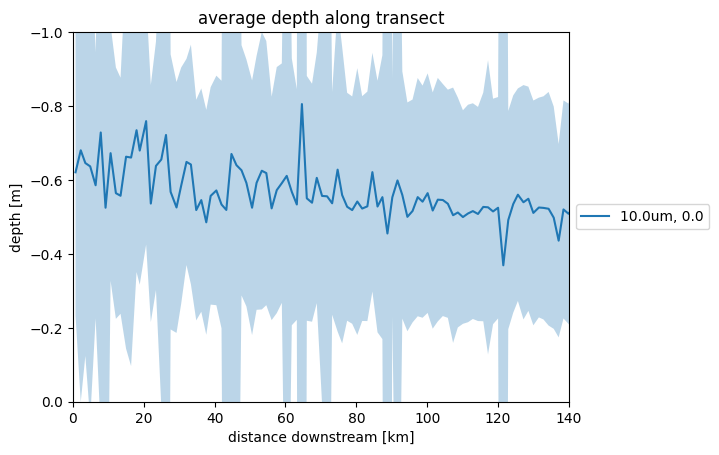

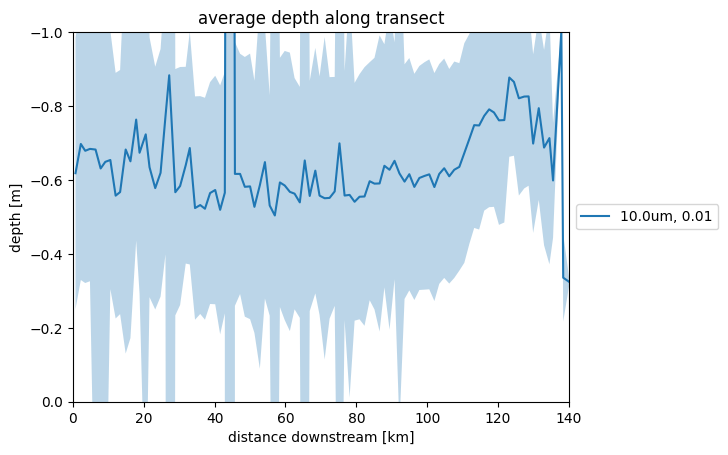

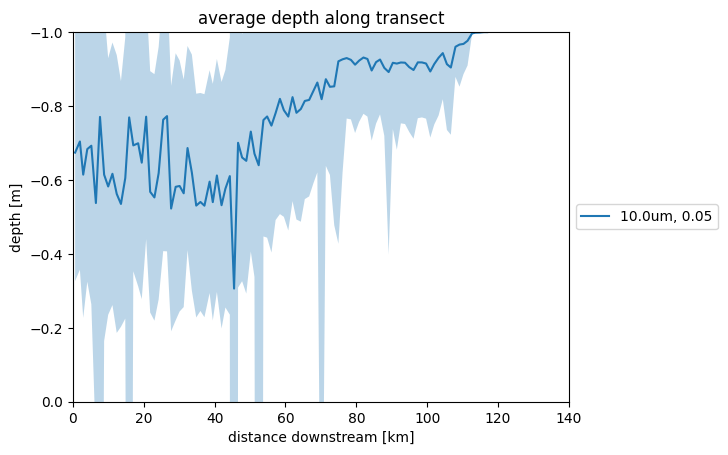

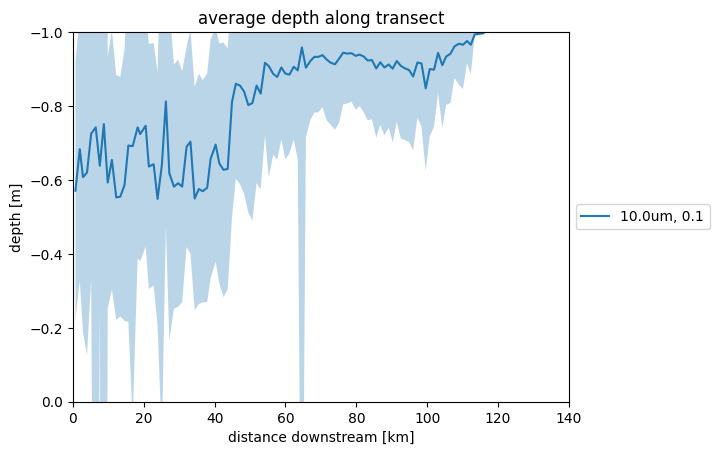

In [17]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_relative_depth_along_transect(norder_elbe, case)

Loaded data
Sliced data
Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
Binned data
Loaded data
Sliced data
Projected data
[1028, 882, 796, 686, 524, 683, 928, 512, 533, 505, 789, 883, 1468, 1480, 1560, 569, 359, 496, 1295, 667, 493, 710, 1378, 1300, 752, 1088, 1080, 2331, 1378, 1202, 1115, 1388, 1437, 1554, 1434, 1380, 1956, 1371, 2046, 1222, 1243, 1522, 1454, 1554, 1440, 1383, 1468, 1207, 2473, 1508, 1477, 1442, 1392, 2139, 1506, 1356, 1414, 1362, 1384, 1412, 1481, 1576, 1607,

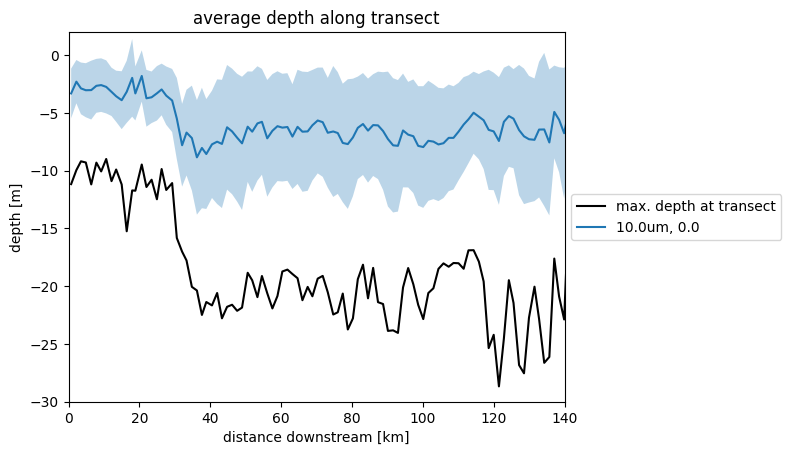

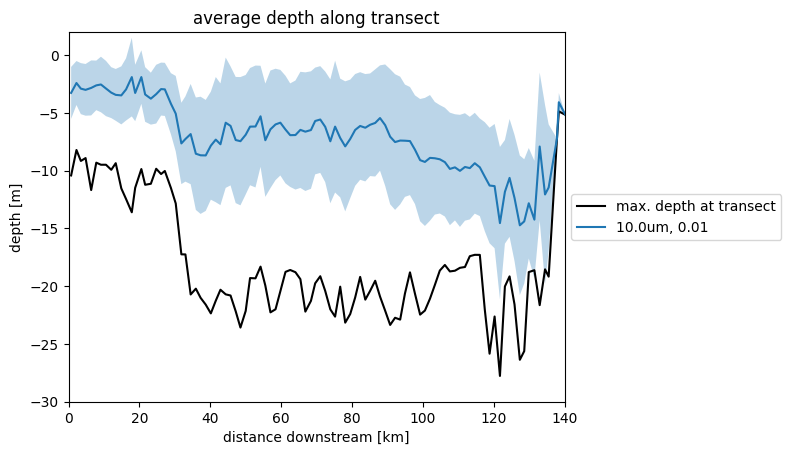

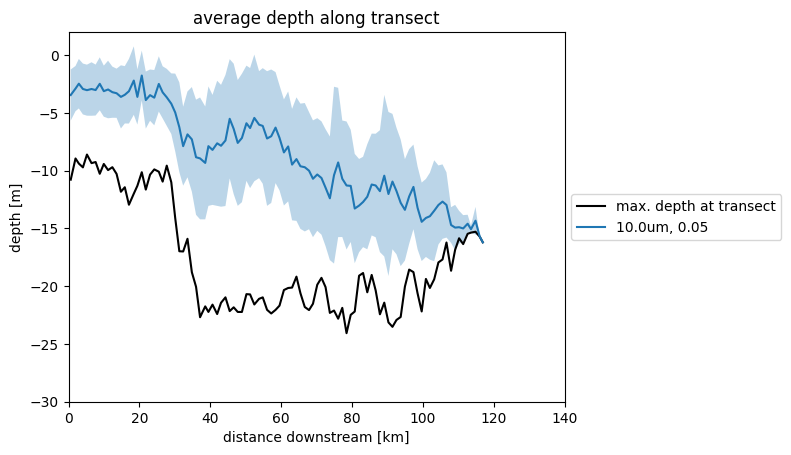

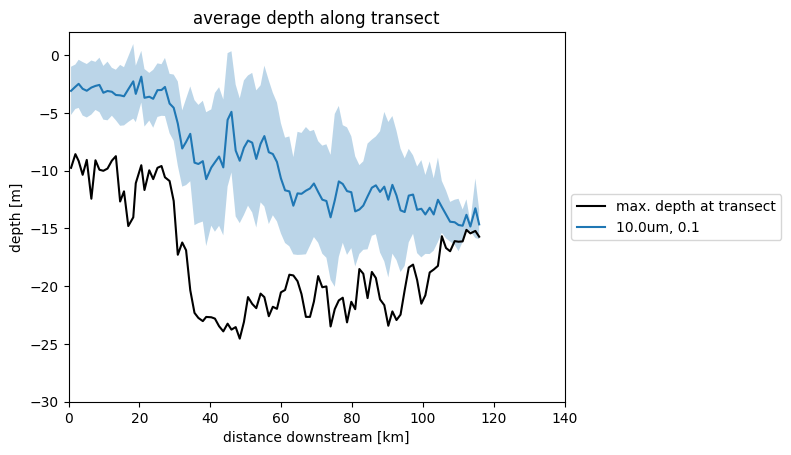

In [18]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_depth_along_transect(norder_elbe, case)

Projected data
[1066, 965, 746, 659, 545, 710, 787, 514, 514, 485, 777, 868, 1350, 1485, 1619, 424, 464, 585, 1533, 464, 540, 787, 1502, 1074, 839, 1149, 1035, 2320, 1408, 1281, 1090, 1348, 1464, 1621, 1261, 1928, 1321, 1578, 1921, 1137, 1339, 1612, 1422, 1591, 1492, 1488, 1370, 1417, 2592, 1377, 1576, 1354, 1953, 1627, 1443, 1413, 1395, 1328, 1544, 1459, 1374, 1319, 1172, 1338, 1273, 1216, 1239, 909, 1032, 901, 969, 881, 882, 805, 700, 675, 572, 569, 538, 559, 518, 474, 525, 385, 322, 318, 373, 430, 295, 241, 215, 143, 171, 155, 183, 147, 137, 103, 104, 18]
1066
965
746
659
545
710
787
514
514
485
777
868
1350
1485
1619
424
464
585
1533
464
540
787
1502
1074
839
1149
1035
2320
1408
1281
1090
1348
1464
1621
1261
1928
1321
1578
1921
1137
1339
1612
1422
1591
1492
1488
1370
1417
2592
1377
1576
1354
1953
1627
1443
1413
1395
1328
1544
1459
1374
1319
1172
1338
1273
1216
1239
909
1032
901
969
881
882
805
700
675
572
569
538
559
518
474
525
385
322
318
373
430
295
241
215
143
171
155
183
147
1

KeyError: 'density'

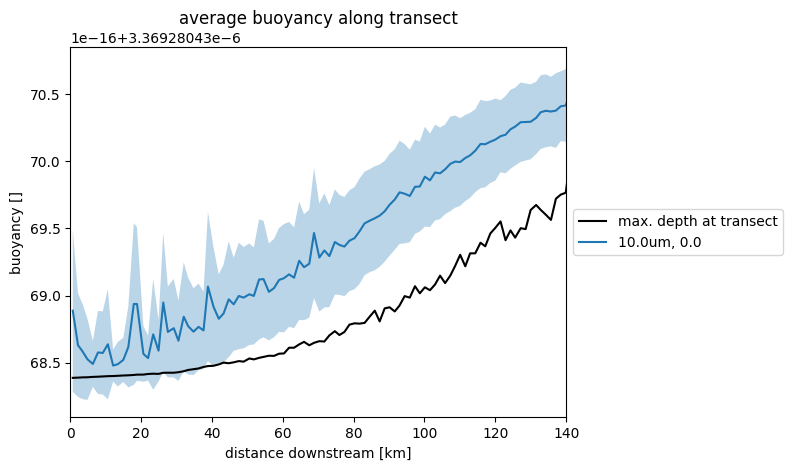

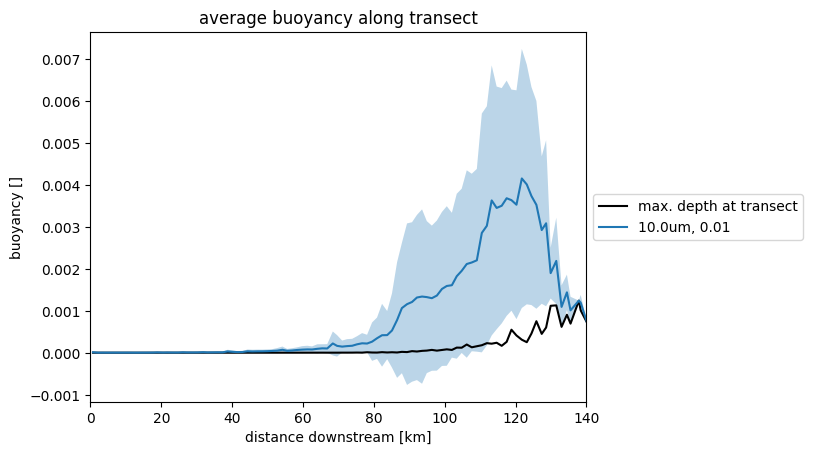

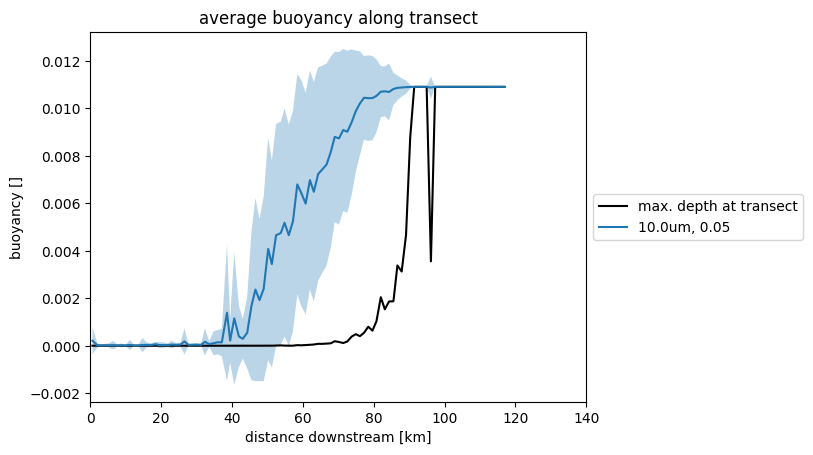

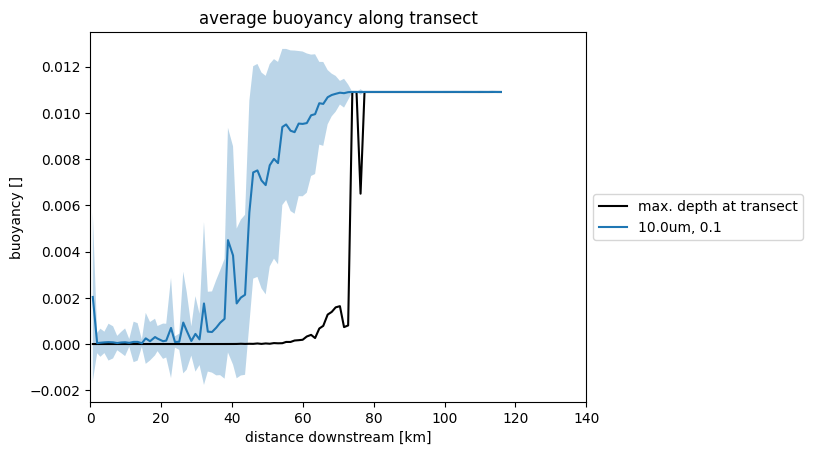

In [19]:
for part_prop in ['buoyancy','density','radius',]:
    for ii in [0,1,2,3]:
        case = get_case_info_files_from_dir(path_to_dir)[ii]
        plot_part_prop_along_transect(norder_elbe, case,part_prop)


In [5]:
print(f'| dryout \t| salinity \t| illumination \t| alive \t| dead \t|')

for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    track_data = load_track_data(case)

    cause_of_death = track_data['cause_of_death']

    cause_of_death = cause_of_death[-1,:]

    # count of particles that died due to [dryout, salinity, illumination]
    count_dryout = np.sum(cause_of_death == 3)
    count_salinity = np.sum(cause_of_death == 1)
    count_illumination = np.sum(cause_of_death == 2)

    count_alive = np.sum(cause_of_death == 0)
    count_dead = np.sum(cause_of_death != 0)

    print(f'| {count_dryout} \t\t| {count_salinity} \t\t| {count_illumination} \t\t| {count_alive} \t\t| {count_dead} \t|')

    

| dryout 	| salinity 	| illumination 	| alive 	| dead 	|
| 4 		| 26 		| 677 		| 19454 		| 707 	|
| 6 		| 1 		| 796 		| 19358 		| 803 	|
| 4 		| 0 		| 923 		| 19234 		| 927 	|
| 3 		| 0 		| 1023 		| 19135 		| 1026 	|


## v31

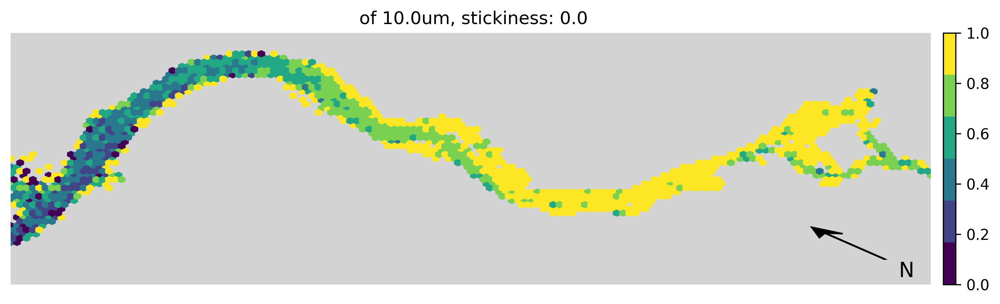

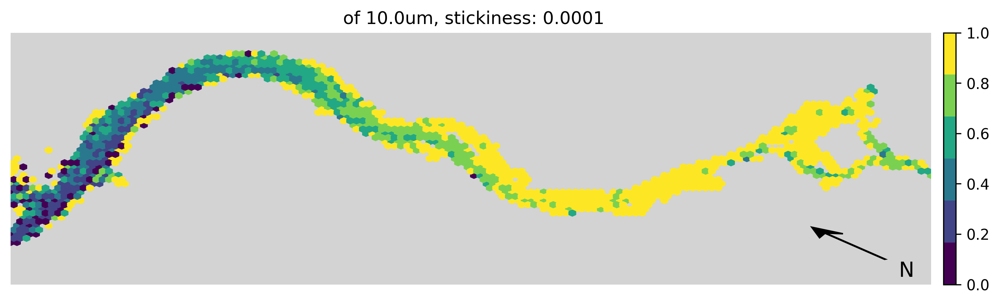

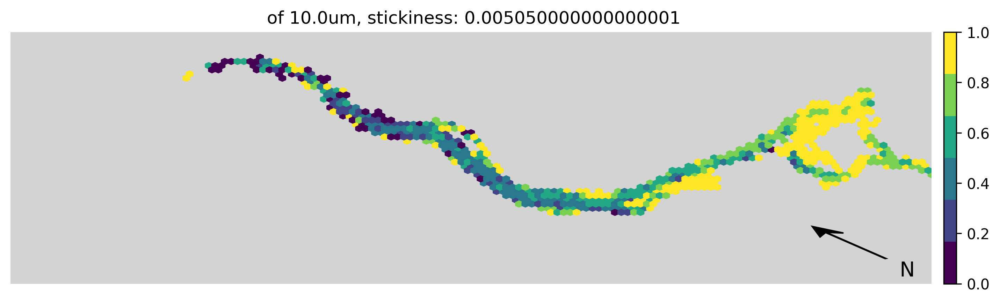

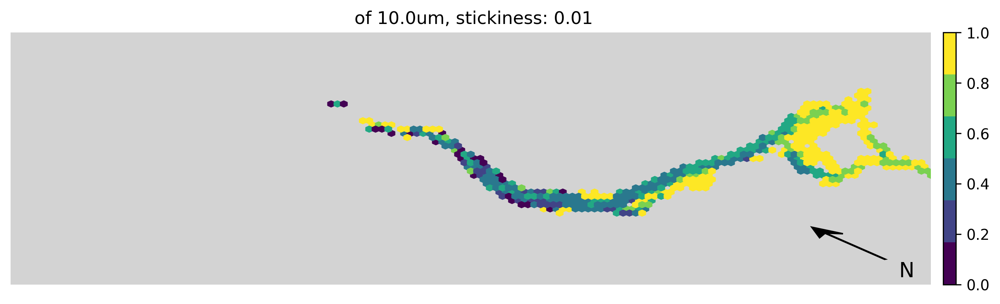

In [7]:
path_to_dir = '/scratch/local1/output/22_11_01_depth_losses_v31'
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_fraction_above_threshold(case,'illumination')

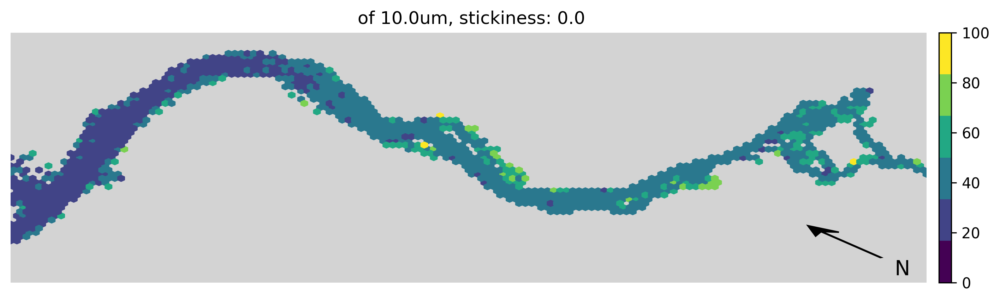

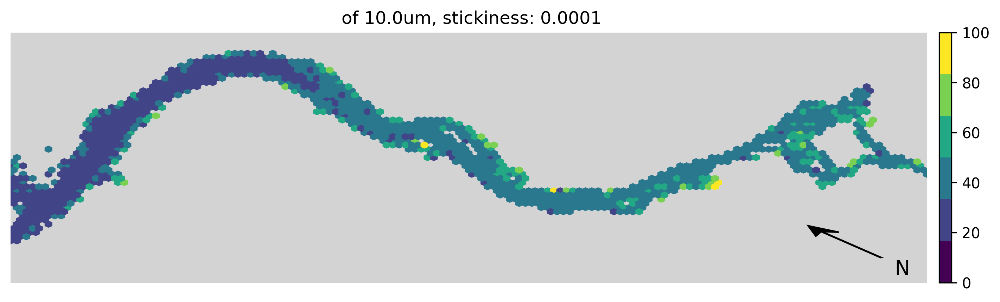

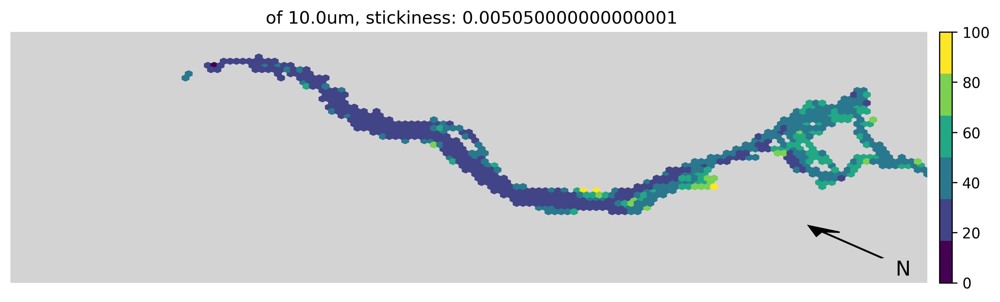

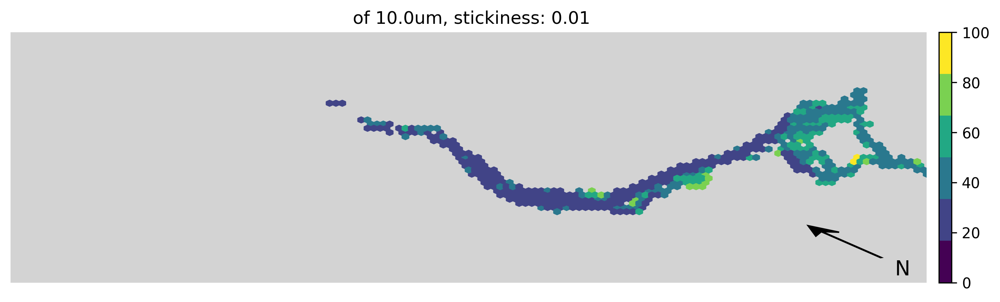

In [8]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    hexmap_of_particle_prop(case,'illumination')

Loaded data
Sliced data
Projected data
[1073, 893, 795, 701, 514, 694, 783, 491, 524, 530, 766, 995, 1229, 1463, 1552, 416, 420, 542, 1551, 550, 538, 825, 1491, 1019, 743, 1127, 959, 2371, 1431, 1231, 1071, 1282, 1488, 1636, 1460, 1870, 1333, 1268, 2188, 1209, 1230, 1505, 1407, 1584, 1435, 1502, 1418, 1250, 2568, 1465, 1469, 1302, 1521, 1902, 1410, 1293, 1361, 1356, 1340, 1448, 1430, 1281, 1226, 1325, 1220, 1228, 1112, 866, 947, 897, 967, 918, 851, 765, 711, 617, 662, 532, 556, 571, 520, 451, 479, 399, 346, 268, 360, 382, 336, 214, 218, 152, 122, 162, 183, 131, 156, 140, 85, 51]
Binned data
Loaded data
Sliced data
Projected data
[943, 885, 758, 720, 530, 677, 940, 484, 548, 551, 740, 918, 1337, 1421, 1624, 470, 423, 505, 1543, 511, 547, 763, 1421, 1099, 696, 1229, 975, 2410, 1343, 1177, 1104, 1400, 1481, 1672, 1346, 1974, 1434, 1379, 2191, 1280, 1326, 1546, 1437, 1673, 1424, 1512, 1502, 1288, 2566, 1487, 1484, 1333, 1624, 1846, 1587, 1403, 1475, 1351, 1358, 1510, 1416, 1303, 1232, 1359

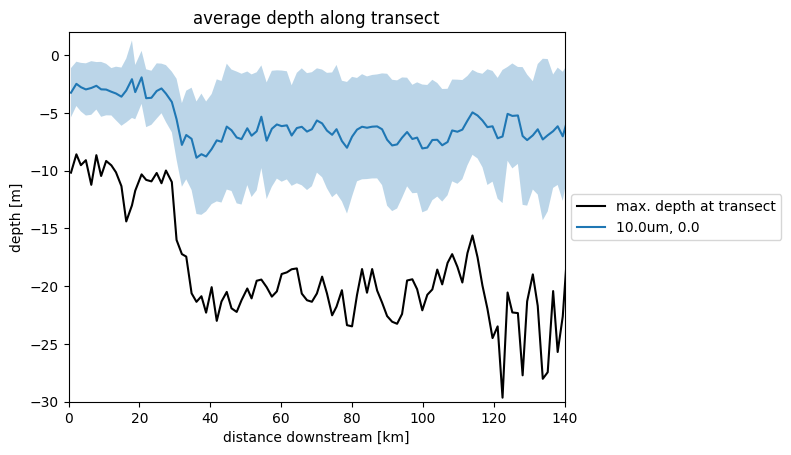

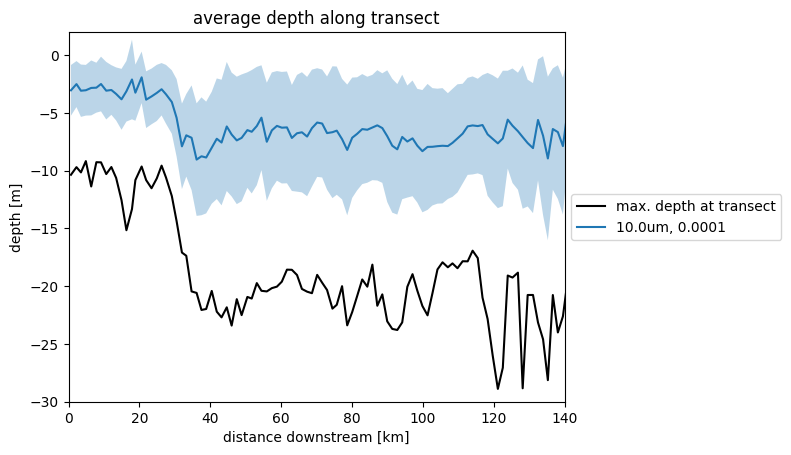

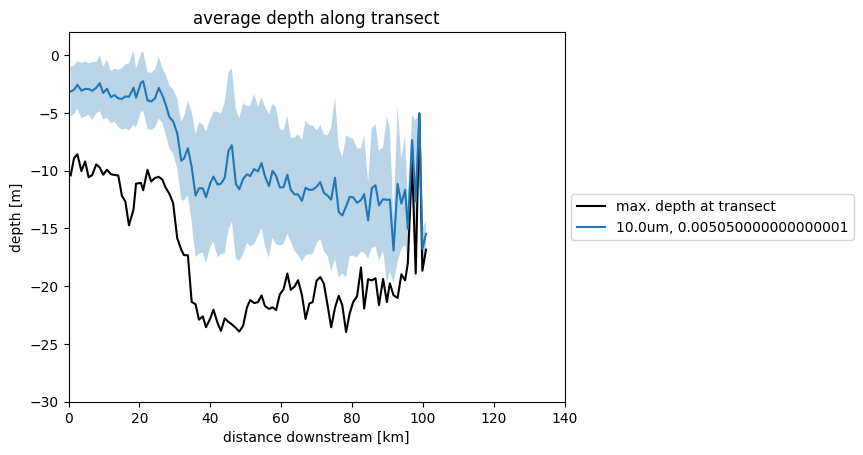

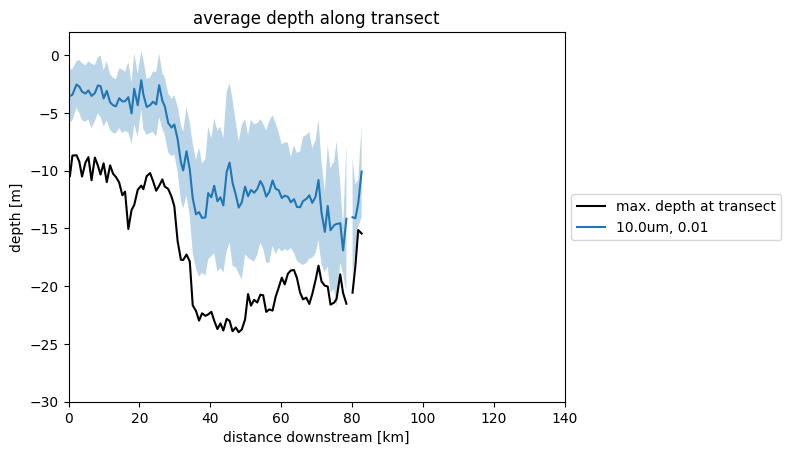

In [9]:
for ii in [0,1,2,3]:
    case = get_case_info_files_from_dir(path_to_dir)[ii]
    plot_depth_along_transect(norder_elbe, case)